In [1]:
import os
from monai.transforms import Compose, LoadImage, EnsureChannelFirst, ScaleIntensity, Resize, ToTensor
from monai.metrics import DiceMetric
from monai.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# Define paths
segmentation_base_path = 'results_on_yes'
ground_truth_base_path = 'ground_truth'

# higher resolution requires more RAM and could result in killed signal
common_size = (128, 128, 128)

In [3]:
# Prepare lists of file paths for segmentation results and ground truth
segmentation_files = []
ground_truth_files = []
original_files = []

# Traverse the segmentation results directory
for subject_folder in os.listdir(segmentation_base_path):
    subject_path = os.path.join(segmentation_base_path, subject_folder)

    for file in os.listdir(subject_path):
        if file.endswith(".nii.gz"):
            original_file = os.path.join(subject_path, file)
            original_files.append(original_file)
        
    
    # Find the folder that starts with "moosez"
    for sub_folder in os.listdir(subject_path):
        if sub_folder.startswith("moosez"):
            segmentation_path = os.path.join(subject_path, sub_folder, 'segmentations')
            
            # Find the .nii.gz file in the segmentations folder
            for file in os.listdir(segmentation_path):
                if file.endswith(".nii.gz"):
                    segmentation_file = os.path.join(segmentation_path, file)
                    
                    # Append the segmentation file path
                    segmentation_files.append(segmentation_file)

                    # Find the corresponding ground truth file
                    ground_truth_folder = os.path.join(ground_truth_base_path, subject_folder)
                    for gt_file in os.listdir(ground_truth_folder):
                        if gt_file.endswith(".nii.gz"):
                            ground_truth_file = os.path.join(ground_truth_folder, gt_file)
                            
                            # Append the ground truth file path
                            ground_truth_files.append(ground_truth_file)
                            break  # Assumes only one ground truth file per folder
                    break  # Assumes only one segmentation file per folder

In [4]:
len(segmentation_files)

62

Dice Score for Pair 0: 0.8897290229797363
Image name: results_on_yes/sub-verse413_split-verse239/moosez-clin_ct_vertebrae-2024-07-14-20-17-33/segmentations/CT_Vertebrae_CT_sub-verse413_split-verse239_ct_0000.nii.gz


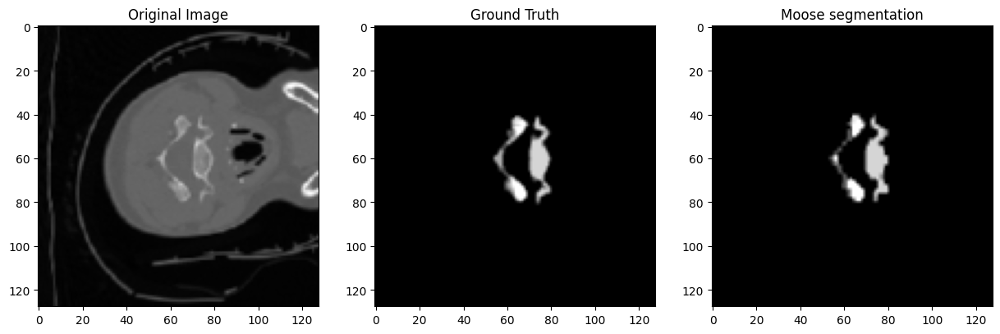

Dice Score for Pair 1: 0.5781662464141846
Image name: results_on_yes/sub-verse096/moosez-clin_ct_vertebrae-2024-07-14-23-46-48/segmentations/CT_Vertebrae_CT_sub-verse096_ct_0000.nii.gz


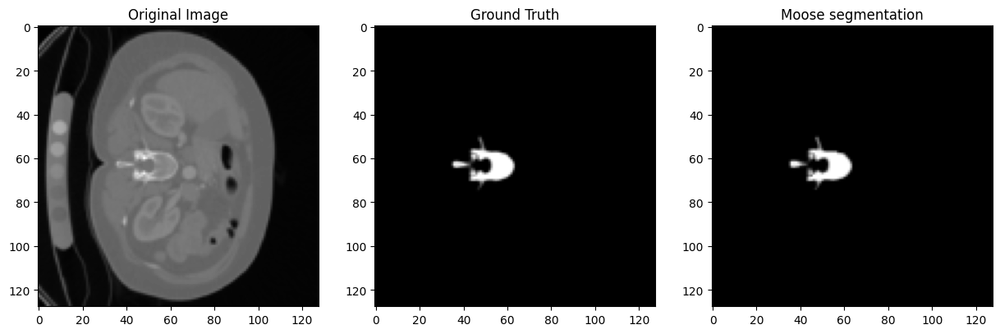

Dice Score for Pair 2: 0.627386212348938
Image name: results_on_yes/sub-verse271/moosez-clin_ct_vertebrae-2024-07-14-21-55-23/segmentations/CT_Vertebrae_CT_sub-verse271_ct_0000.nii.gz


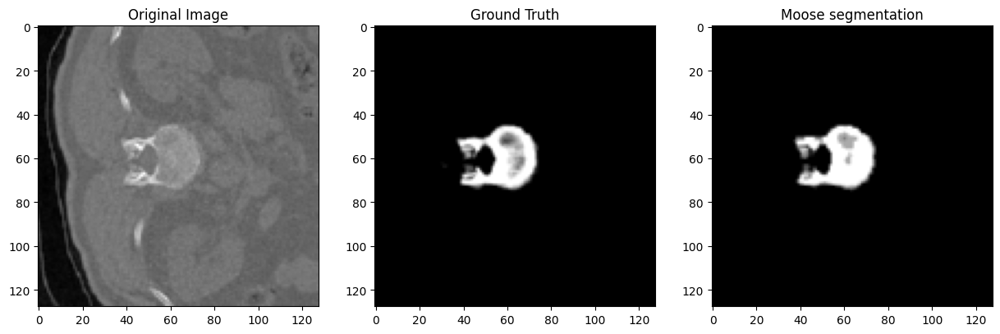

Dice Score for Pair 3: 0.5617055296897888
Image name: results_on_yes/sub-verse088/moosez-clin_ct_vertebrae-2024-07-14-22-57-07/segmentations/CT_Vertebrae_CT_sub-verse088_ct_0000.nii.gz


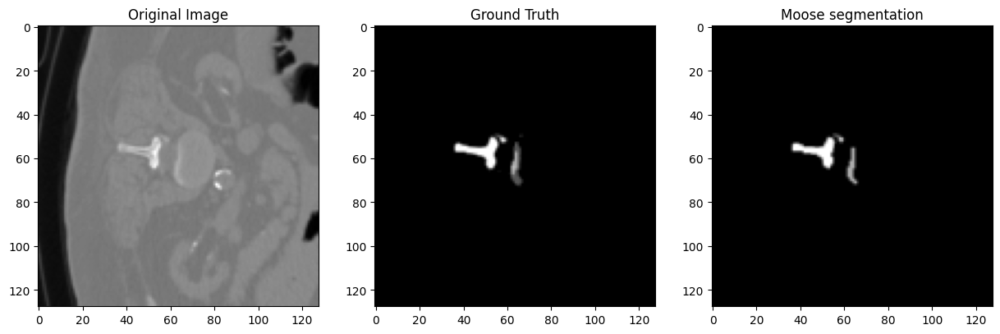

Dice Score for Pair 4: 0.8409313559532166
Image name: results_on_yes/sub-verse230/moosez-clin_ct_vertebrae-2024-07-15-00-07-53/segmentations/CT_Vertebrae_CT_sub-verse230_ct_0000.nii.gz


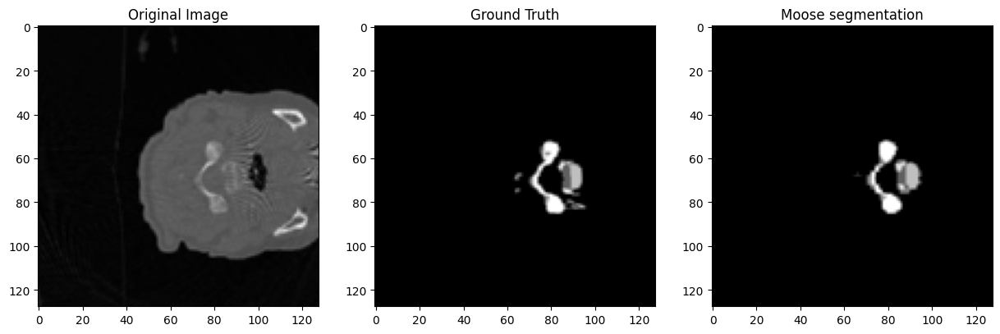

Dice Score for Pair 5: 0.6077131032943726
Image name: results_on_yes/sub-verse097/moosez-clin_ct_vertebrae-2024-07-14-22-38-59/segmentations/CT_Vertebrae_CT_sub-verse097_ct_0000.nii.gz


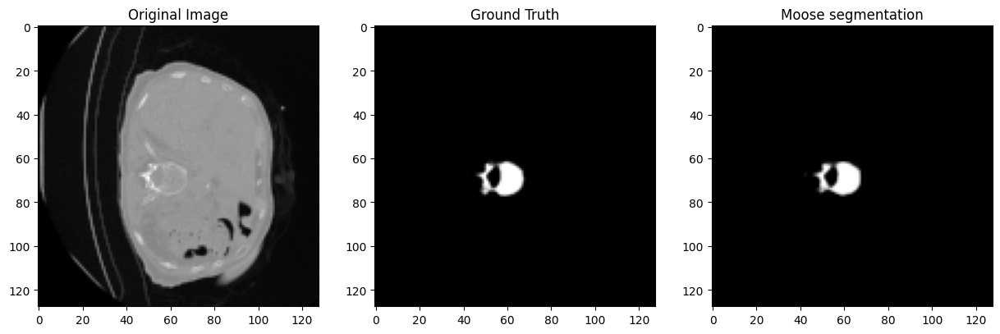

Dice Score for Pair 6: 0.7756457328796387
Image name: results_on_yes/sub-verse080/moosez-clin_ct_vertebrae-2024-07-15-00-42-12/segmentations/CT_Vertebrae_CT_sub-verse080_ct_0000.nii.gz


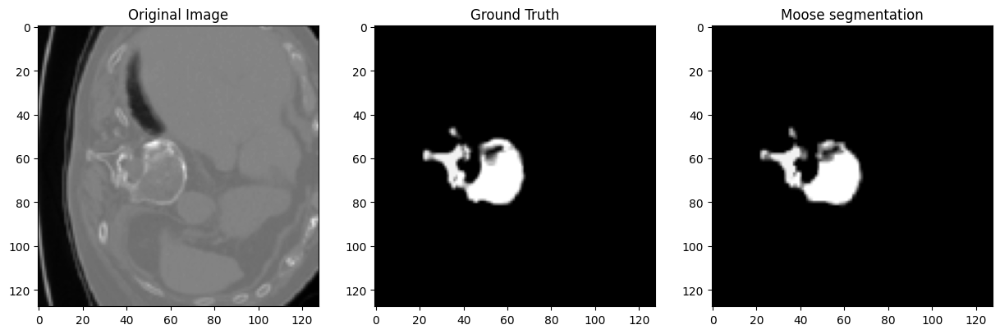

Dice Score for Pair 7: 0.564998209476471
Image name: results_on_yes/sub-verse072/moosez-clin_ct_vertebrae-2024-07-15-00-09-26/segmentations/CT_Vertebrae_CT_sub-verse072_ct_0000.nii.gz


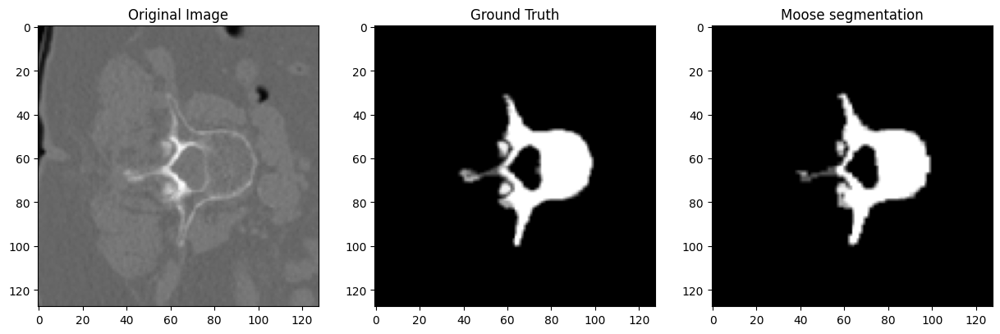

Dice Score for Pair 8: 0.6024006009101868
Image name: results_on_yes/sub-verse408_split-verse265/moosez-clin_ct_vertebrae-2024-07-14-20-33-01/segmentations/CT_Vertebrae_CT_sub-verse408_split-verse265_ct_0000.nii.gz


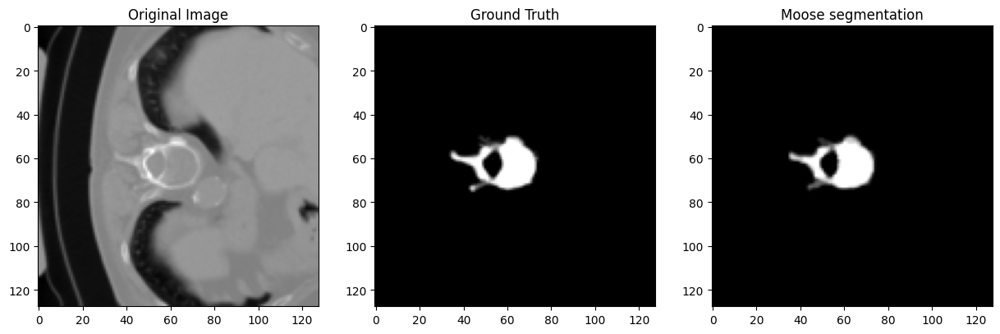

Dice Score for Pair 9: 0.49399763345718384
Image name: results_on_yes/sub-verse073/moosez-clin_ct_vertebrae-2024-07-14-22-08-17/segmentations/CT_Vertebrae_CT_sub-verse073_ct_0000.nii.gz


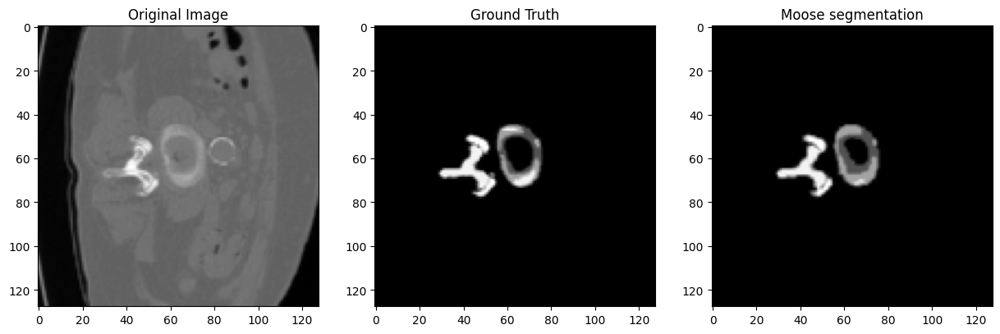

Dice Score for Pair 10: 0.8247114419937134
Image name: results_on_yes/sub-verse410_split-verse227/moosez-clin_ct_vertebrae-2024-07-14-23-24-28/segmentations/CT_Vertebrae_CT_sub-verse410_split-verse227_ct_0000.nii.gz


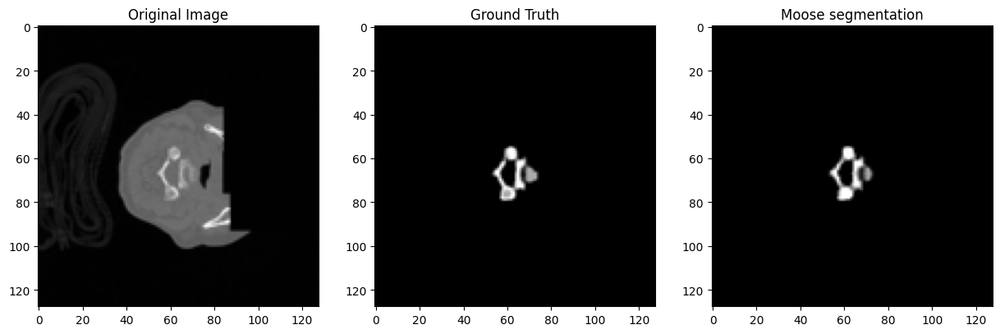

Dice Score for Pair 11: 0.33127066493034363
Image name: results_on_yes/sub-verse051/moosez-clin_ct_vertebrae-2024-07-14-23-27-27/segmentations/CT_Vertebrae_CT_sub-verse051_ct_0000.nii.gz


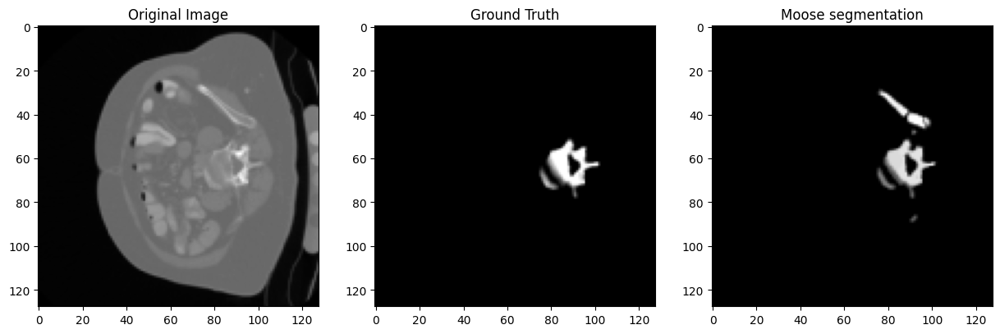

Dice Score for Pair 12: 0.5977110862731934
Image name: results_on_yes/sub-verse101/moosez-clin_ct_vertebrae-2024-07-15-00-28-02/segmentations/CT_Vertebrae_CT_sub-verse101_ct_0000.nii.gz


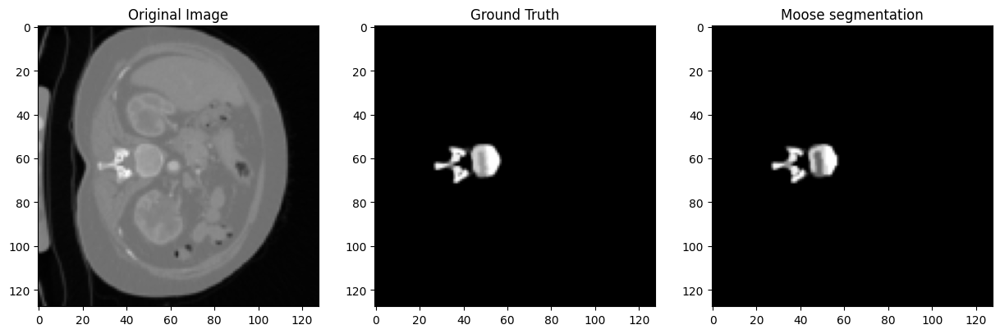

Dice Score for Pair 13: 0.6182160973548889
Image name: results_on_yes/sub-verse138/moosez-clin_ct_vertebrae-2024-07-14-19-09-27/segmentations/CT_Vertebrae_CT_sub-verse138_ct_0000.nii.gz


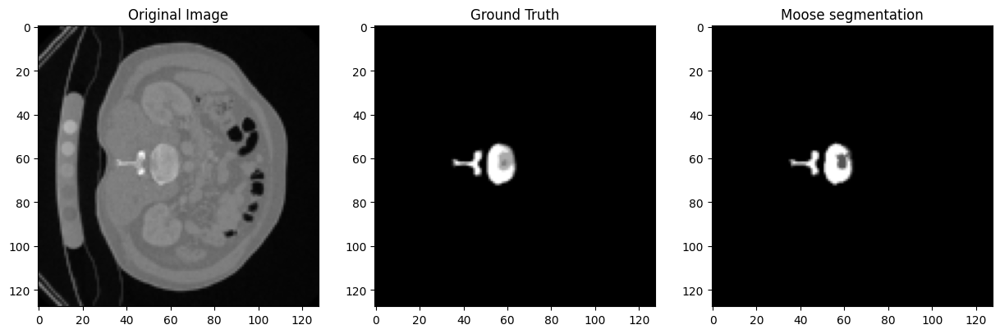

Dice Score for Pair 14: 0.8768226504325867
Image name: results_on_yes/sub-verse225/moosez-clin_ct_vertebrae-2024-07-14-19-04-38/segmentations/CT_Vertebrae_CT_sub-verse225_ct_0000.nii.gz


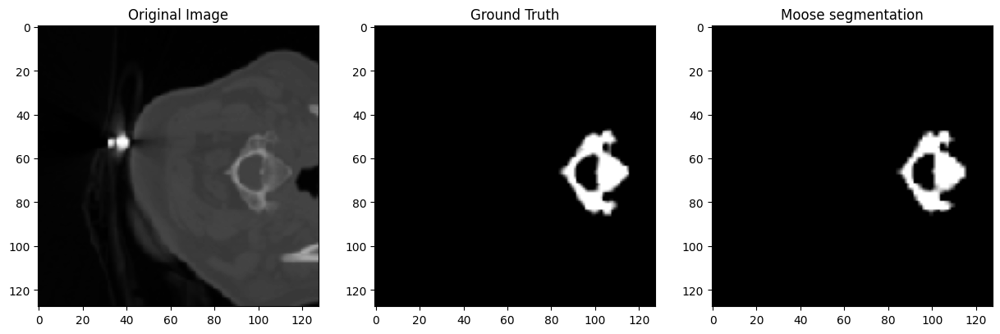

Dice Score for Pair 15: 0.7987690567970276
Image name: results_on_yes/sub-verse100/moosez-clin_ct_vertebrae-2024-07-15-00-50-03/segmentations/CT_Vertebrae_CT_sub-verse100_ct_0000.nii.gz


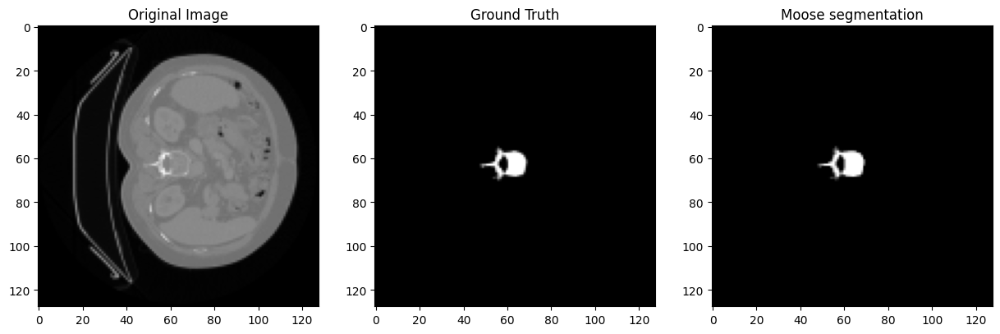

Dice Score for Pair 16: 0.6158541440963745
Image name: results_on_yes/sub-verse413_split-verse272/moosez-clin_ct_vertebrae-2024-07-15-00-46-02/segmentations/CT_Vertebrae_CT_sub-verse413_split-verse272_ct_0000.nii.gz


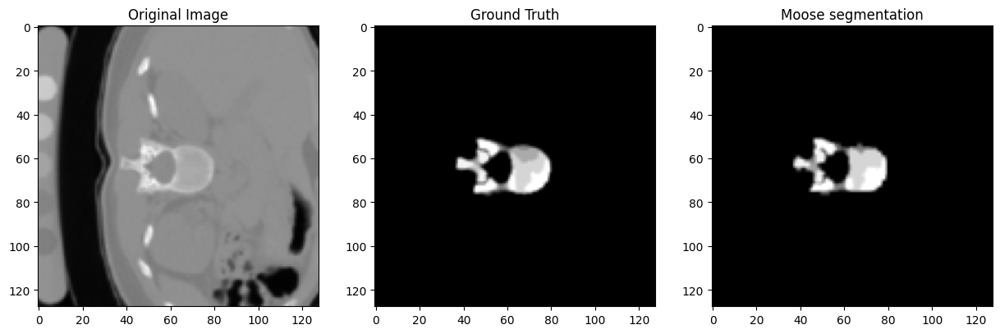

Dice Score for Pair 17: 0.8866528868675232
Image name: results_on_yes/sub-verse105/moosez-clin_ct_vertebrae-2024-07-14-22-01-03/segmentations/CT_Vertebrae_CT_sub-verse105_ct_0000.nii.gz


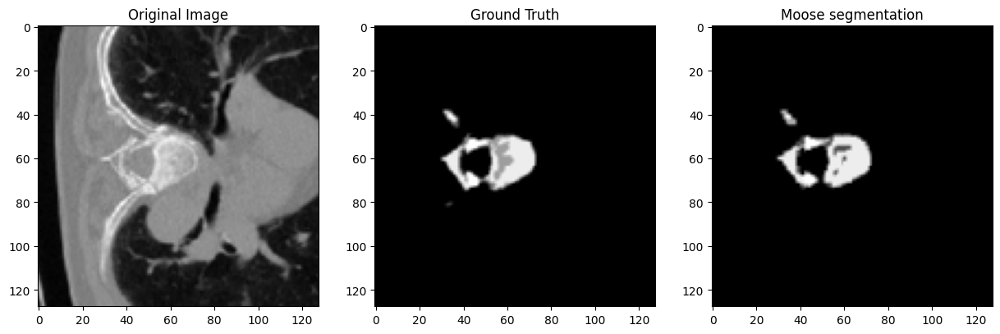

Dice Score for Pair 18: 0.6818040013313293
Image name: results_on_yes/sub-verse269/moosez-clin_ct_vertebrae-2024-07-14-19-06-42/segmentations/CT_Vertebrae_CT_sub-verse269_ct_0000.nii.gz


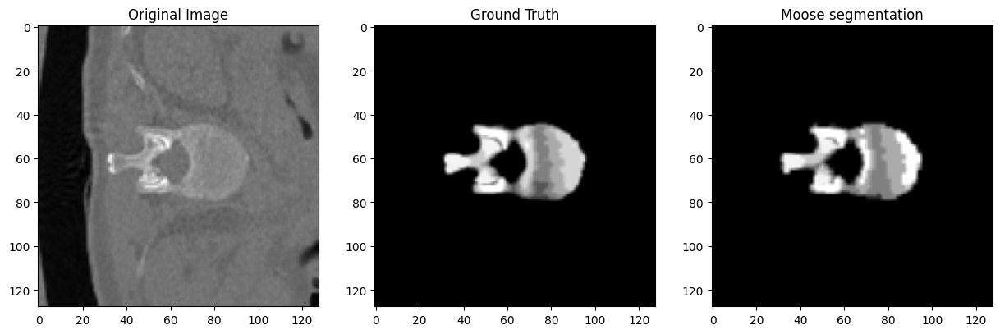

Dice Score for Pair 19: 0.5970391035079956
Image name: results_on_yes/sub-verse111/moosez-clin_ct_vertebrae-2024-07-14-19-03-03/segmentations/CT_Vertebrae_CT_sub-verse111_ct_0000.nii.gz


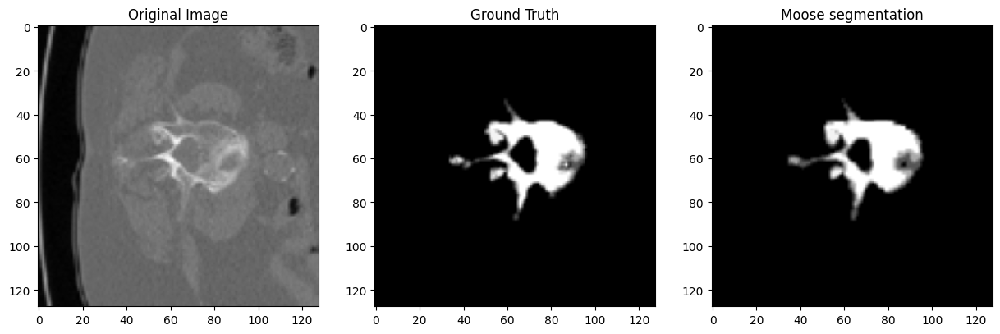

Dice Score for Pair 20: 0.725104570388794
Image name: results_on_yes/sub-verse130/moosez-clin_ct_vertebrae-2024-07-14-23-20-12/segmentations/CT_Vertebrae_CT_sub-verse130_ct_0000.nii.gz


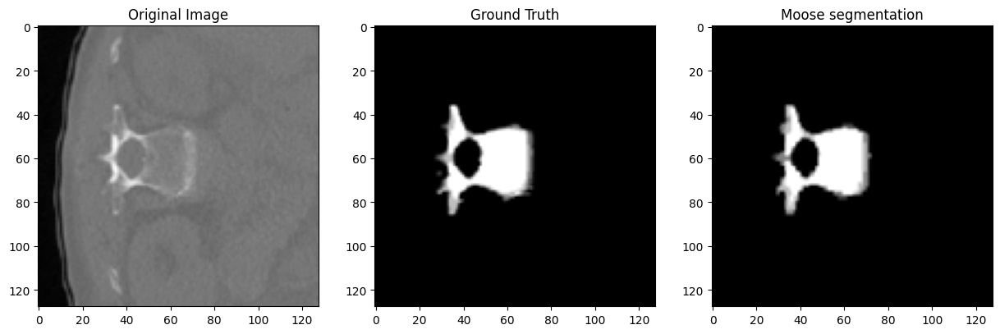

Dice Score for Pair 21: 0.5789830088615417
Image name: results_on_yes/sub-verse143/moosez-clin_ct_vertebrae-2024-07-14-20-54-03/segmentations/CT_Vertebrae_CT_sub-verse143_ct_0000.nii.gz


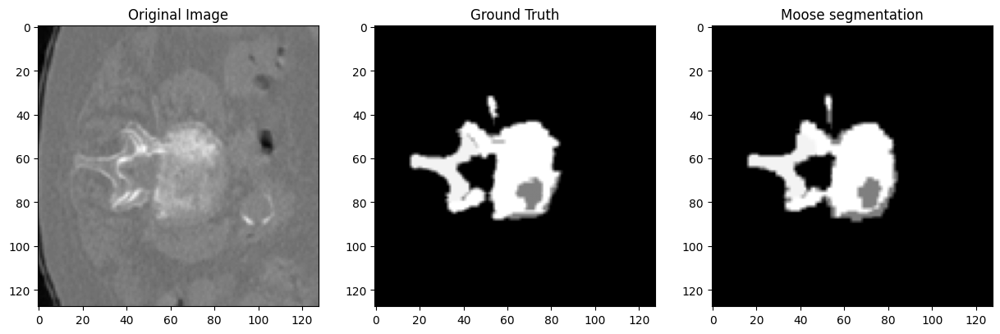

Dice Score for Pair 22: 0.5408457517623901
Image name: results_on_yes/sub-verse063/moosez-clin_ct_vertebrae-2024-07-14-20-55-03/segmentations/CT_Vertebrae_CT_sub-verse063_ct_0000.nii.gz


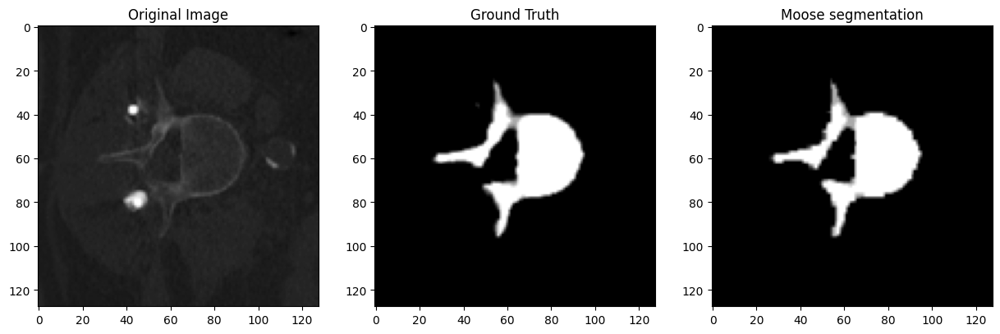

Dice Score for Pair 23: 0.10747791826725006
Image name: results_on_yes/sub-verse116/moosez-clin_ct_vertebrae-2024-07-14-21-14-11/segmentations/CT_Vertebrae_CT_sub-verse116_ct_0000.nii.gz


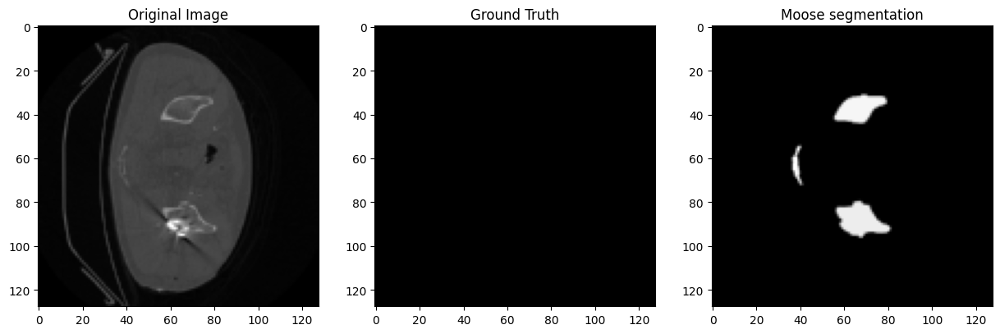

Dice Score for Pair 24: 0.8049150705337524
Image name: results_on_yes/sub-verse081/moosez-clin_ct_vertebrae-2024-07-15-00-05-51/segmentations/CT_Vertebrae_CT_sub-verse081_ct_0000.nii.gz


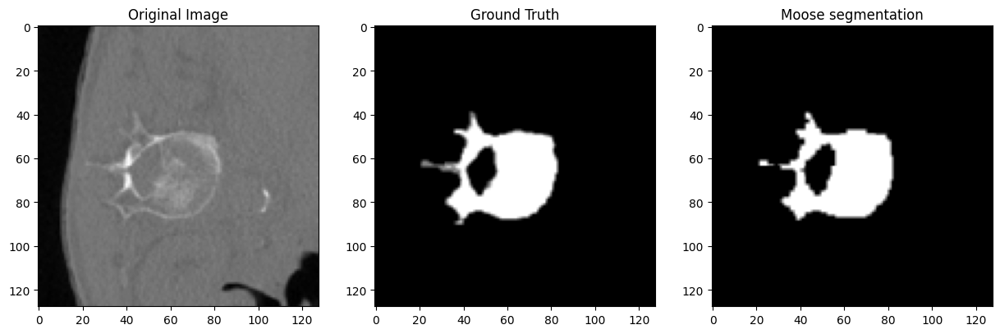

Dice Score for Pair 25: 0.47679832577705383
Image name: results_on_yes/sub-verse133/moosez-clin_ct_vertebrae-2024-07-14-22-17-25/segmentations/CT_Vertebrae_CT_sub-verse133_ct_0000.nii.gz


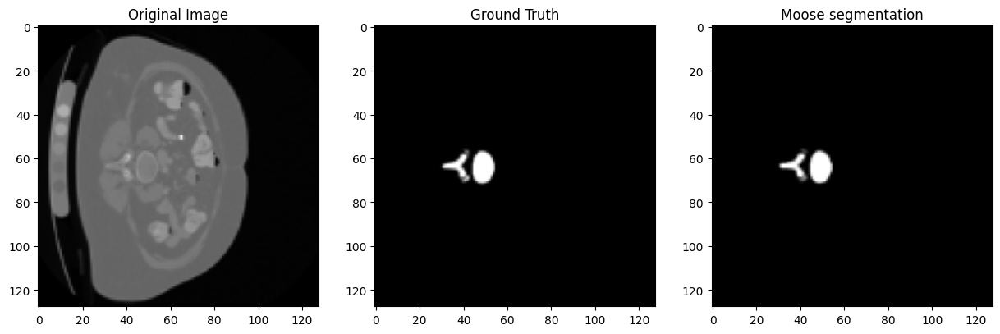

Dice Score for Pair 26: 0.410284161567688
Image name: results_on_yes/sub-verse071/moosez-clin_ct_vertebrae-2024-07-14-20-38-43/segmentations/CT_Vertebrae_CT_sub-verse071_ct_0000.nii.gz


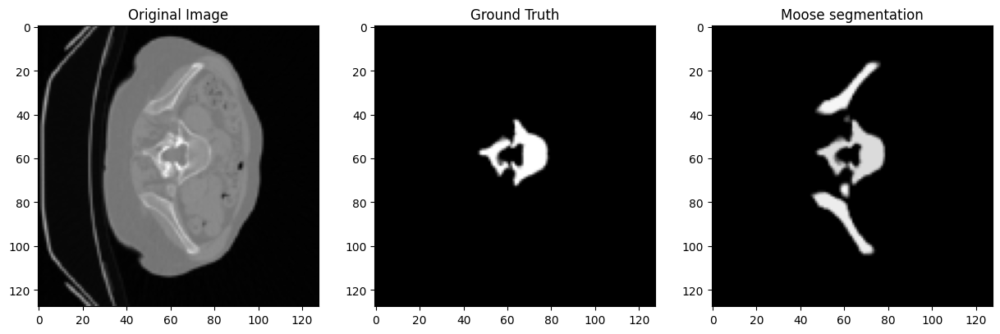

Dice Score for Pair 27: 0.8669998049736023
Image name: results_on_yes/sub-verse125/moosez-clin_ct_vertebrae-2024-07-14-21-00-27/segmentations/CT_Vertebrae_CT_sub-verse125_ct_0000.nii.gz


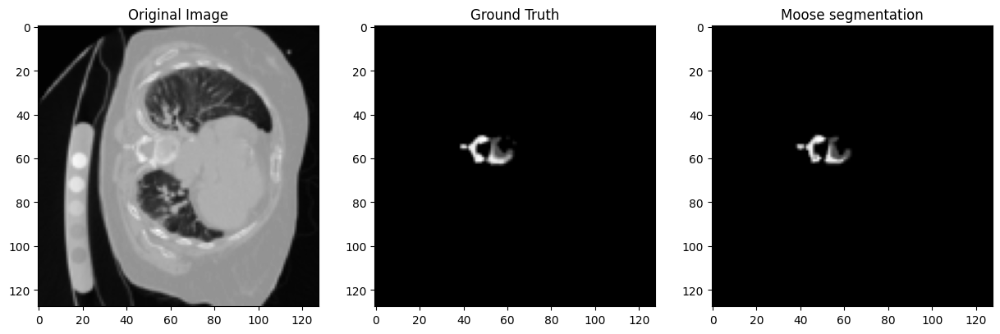

Dice Score for Pair 28: 0.5622529983520508
Image name: results_on_yes/sub-verse144/moosez-clin_ct_vertebrae-2024-07-15-01-23-27/segmentations/CT_Vertebrae_CT_sub-verse144_ct_0000.nii.gz


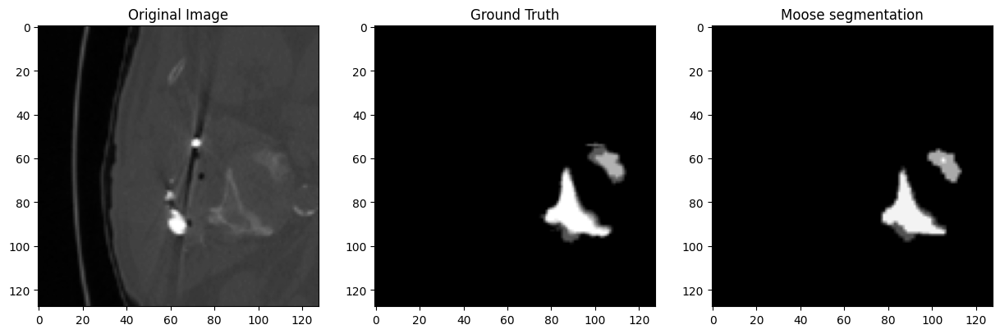

Dice Score for Pair 29: 0.8173441290855408
Image name: results_on_yes/sub-verse411_split-verse232/moosez-clin_ct_vertebrae-2024-07-14-23-00-57/segmentations/CT_Vertebrae_CT_sub-verse411_split-verse232_ct_0000.nii.gz


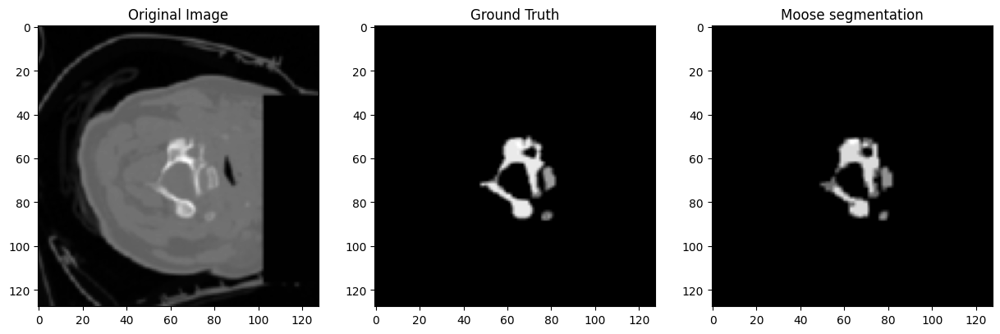

Dice Score for Pair 30: 0.6230134963989258
Image name: results_on_yes/sub-verse410_split-verse267/moosez-clin_ct_vertebrae-2024-07-14-21-51-33/segmentations/CT_Vertebrae_CT_sub-verse410_split-verse267_ct_0000.nii.gz


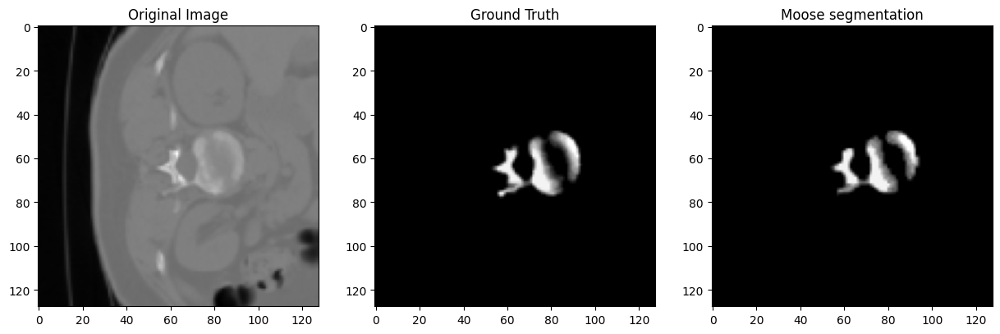

Dice Score for Pair 31: 0.531020998954773
Image name: results_on_yes/sub-verse113/moosez-clin_ct_vertebrae-2024-07-14-22-12-04/segmentations/CT_Vertebrae_CT_sub-verse113_ct_0000.nii.gz


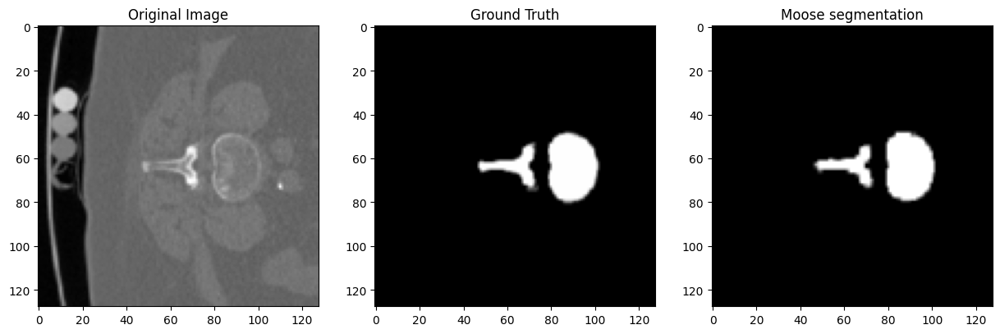

Dice Score for Pair 32: 0.6354546546936035
Image name: results_on_yes/sub-verse412_split-verse290/moosez-clin_ct_vertebrae-2024-07-15-01-17-42/segmentations/CT_Vertebrae_CT_sub-verse412_split-verse290_ct_0000.nii.gz


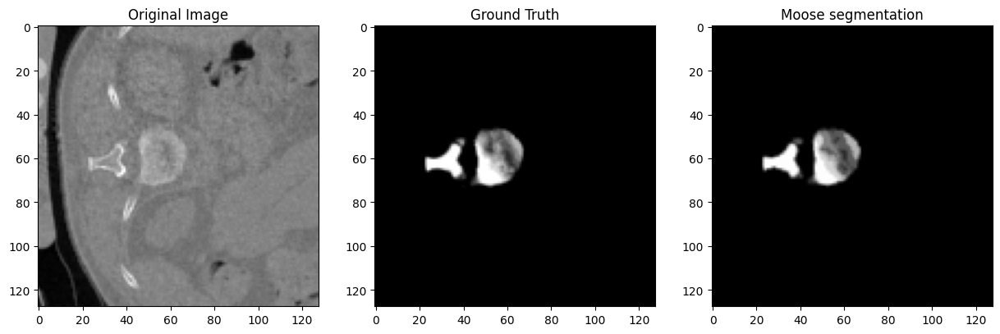

Dice Score for Pair 33: 0.8859193325042725
Image name: results_on_yes/sub-verse409_split-verse226/moosez-clin_ct_vertebrae-2024-07-14-22-02-38/segmentations/CT_Vertebrae_CT_sub-verse409_split-verse226_ct_0000.nii.gz


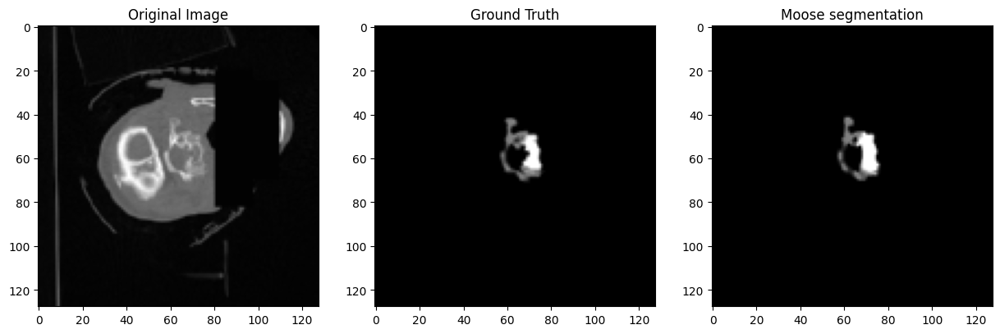

Dice Score for Pair 34: 0.5805936455726624
Image name: results_on_yes/sub-verse152/moosez-clin_ct_vertebrae-2024-07-15-01-27-41/segmentations/CT_Vertebrae_CT_sub-verse152_ct_0000.nii.gz


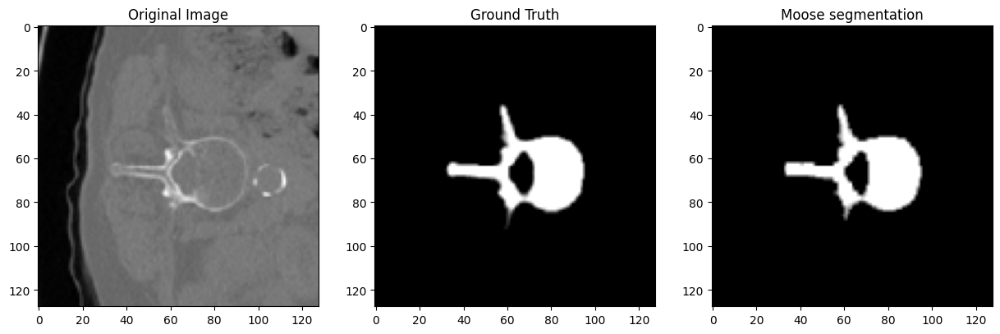

Dice Score for Pair 35: 0.45269113779067993
Image name: results_on_yes/sub-verse102/moosez-clin_ct_vertebrae-2024-07-14-20-57-45/segmentations/CT_Vertebrae_CT_sub-verse102_ct_0000.nii.gz


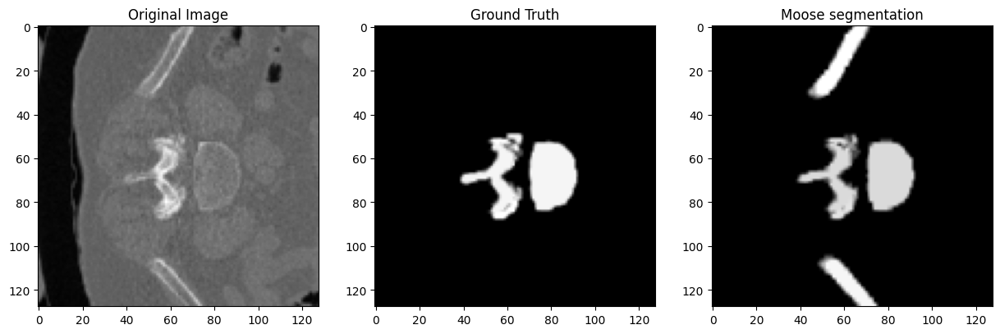

Dice Score for Pair 36: 0.5943877696990967
Image name: results_on_yes/sub-verse137/moosez-clin_ct_vertebrae-2024-07-14-21-39-15/segmentations/CT_Vertebrae_CT_sub-verse137_ct_0000.nii.gz


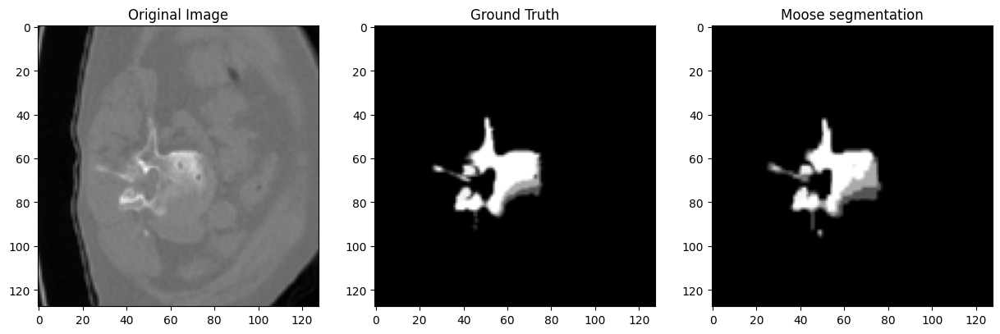

Dice Score for Pair 37: 0.8582088351249695
Image name: results_on_yes/sub-verse112/moosez-clin_ct_vertebrae-2024-07-14-20-19-07/segmentations/CT_Vertebrae_CT_sub-verse112_ct_0000.nii.gz


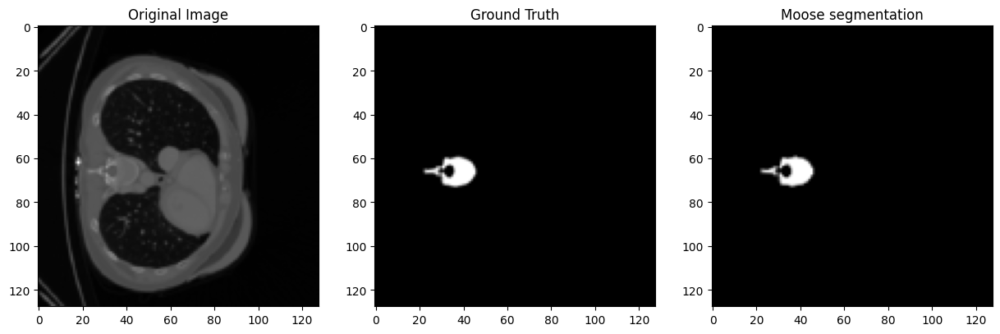

Dice Score for Pair 38: 0.5106135606765747
Image name: results_on_yes/sub-verse124/moosez-clin_ct_vertebrae-2024-07-15-00-04-12/segmentations/CT_Vertebrae_CT_sub-verse124_ct_0000.nii.gz


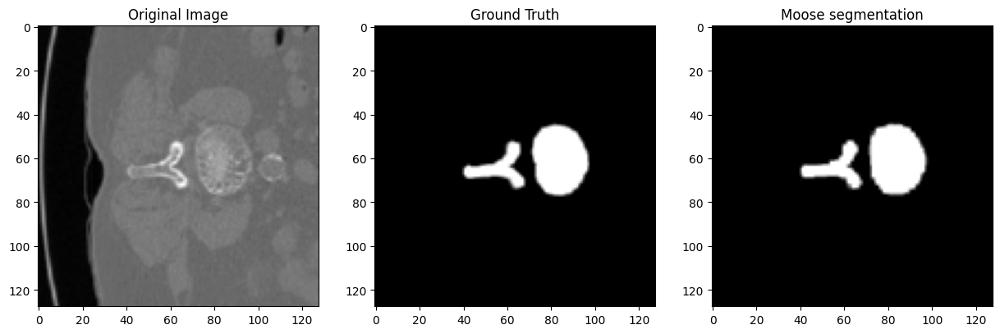

Dice Score for Pair 39: 0.6602481603622437
Image name: results_on_yes/sub-verse134/moosez-clin_ct_vertebrae-2024-07-15-00-06-52/segmentations/CT_Vertebrae_CT_sub-verse134_ct_0000.nii.gz


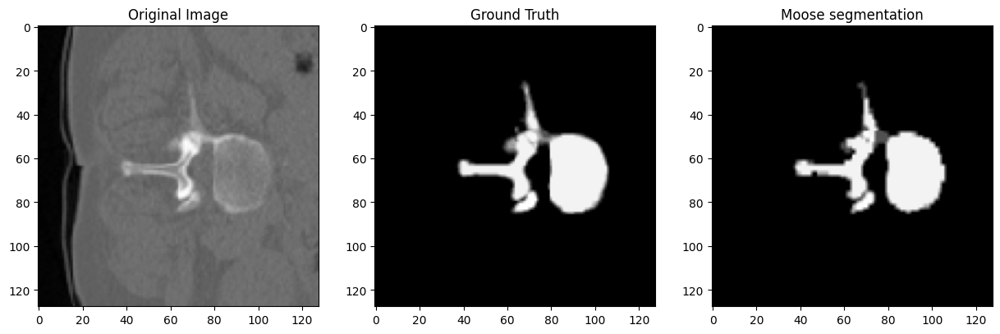

Dice Score for Pair 40: 0.596752405166626
Image name: results_on_yes/sub-verse085/moosez-clin_ct_vertebrae-2024-07-15-01-26-08/segmentations/CT_Vertebrae_CT_sub-verse085_ct_0000.nii.gz


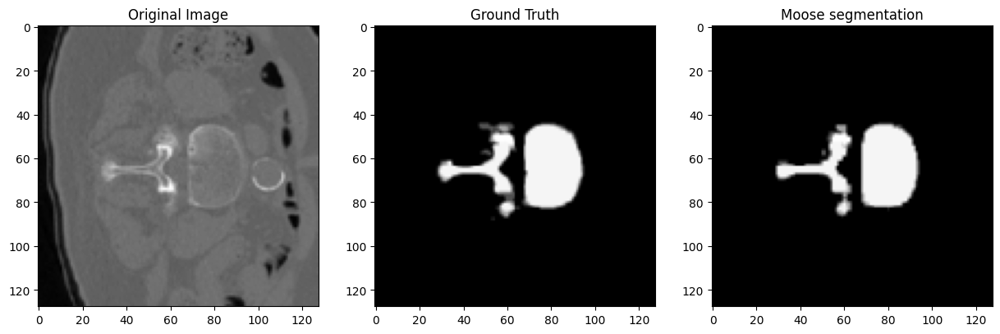

Dice Score for Pair 41: 0.6651078462600708
Image name: results_on_yes/sub-verse147/moosez-clin_ct_vertebrae-2024-07-14-23-02-31/segmentations/CT_Vertebrae_CT_sub-verse147_ct_0000.nii.gz


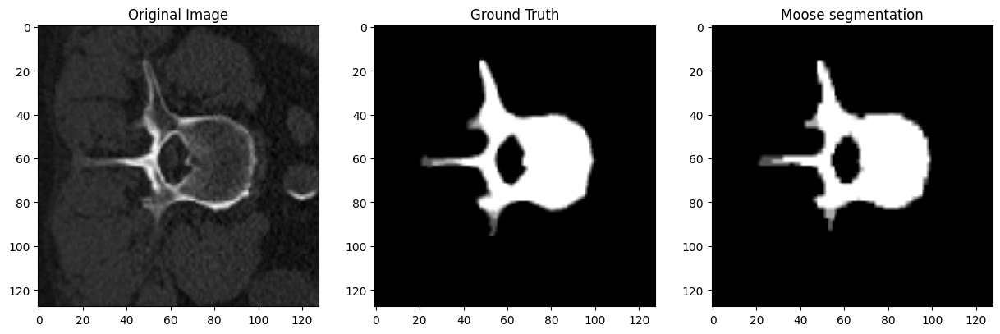

Dice Score for Pair 42: 0.8925895094871521
Image name: results_on_yes/sub-verse217/moosez-clin_ct_vertebrae-2024-07-14-23-44-41/segmentations/CT_Vertebrae_CT_sub-verse217_ct_0000.nii.gz


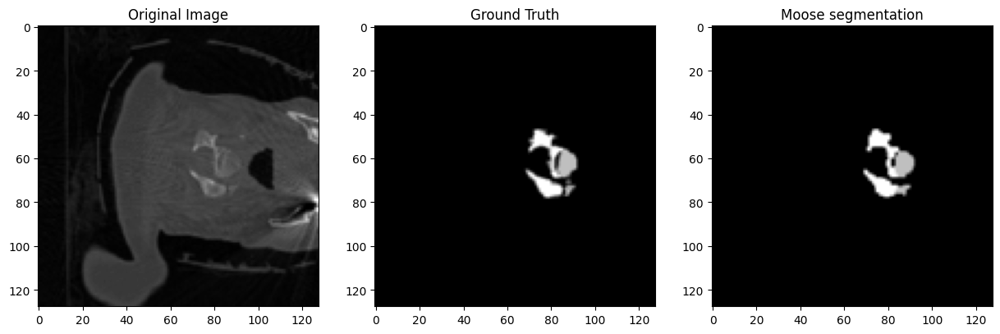

Dice Score for Pair 43: 0.5627692341804504
Image name: results_on_yes/sub-verse401_split-verse253/moosez-clin_ct_vertebrae-2024-07-15-00-10-28/segmentations/CT_Vertebrae_CT_sub-verse401_split-verse253_ct_0000.nii.gz


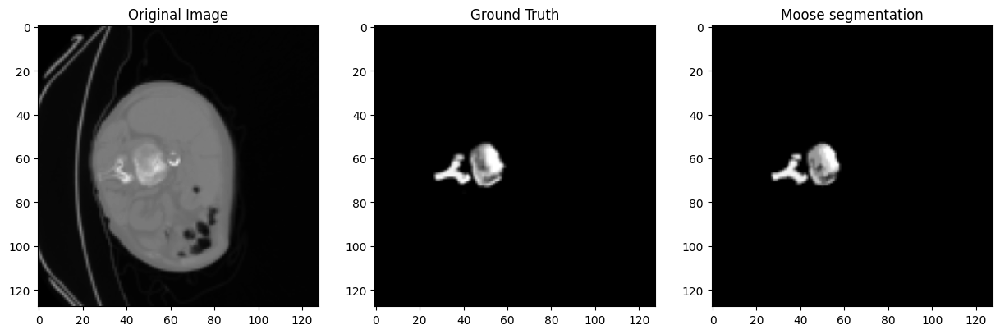

Dice Score for Pair 44: 0.44511687755584717
Image name: results_on_yes/sub-verse107/moosez-clin_ct_vertebrae-2024-07-14-18-52-33/segmentations/CT_Vertebrae_CT_sub-verse107_ct_0000.nii.gz


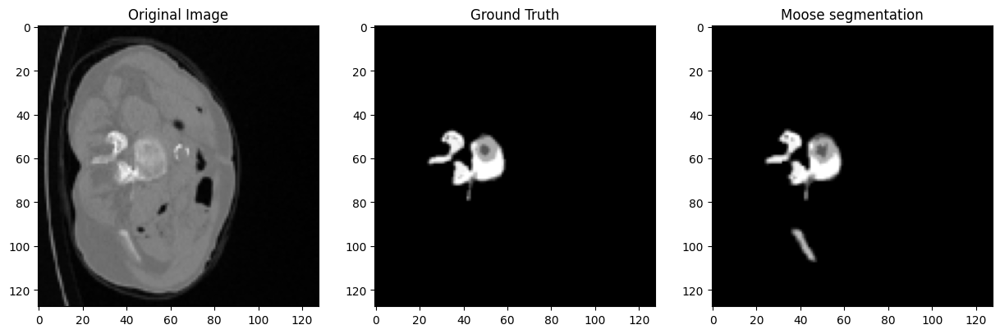

Dice Score for Pair 45: 0.5890316963195801
Image name: results_on_yes/sub-verse093/moosez-clin_ct_vertebrae-2024-07-14-22-13-38/segmentations/CT_Vertebrae_CT_sub-verse093_ct_0000.nii.gz


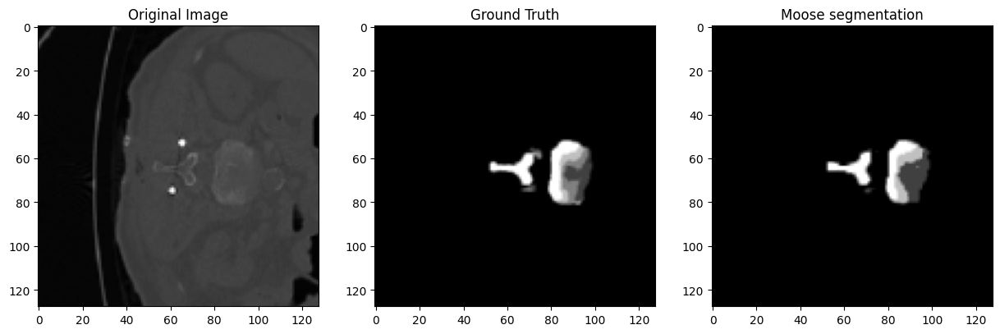

Dice Score for Pair 46: 0.7018632292747498
Image name: results_on_yes/sub-verse078/moosez-clin_ct_vertebrae-2024-07-14-19-05-40/segmentations/CT_Vertebrae_CT_sub-verse078_ct_0000.nii.gz


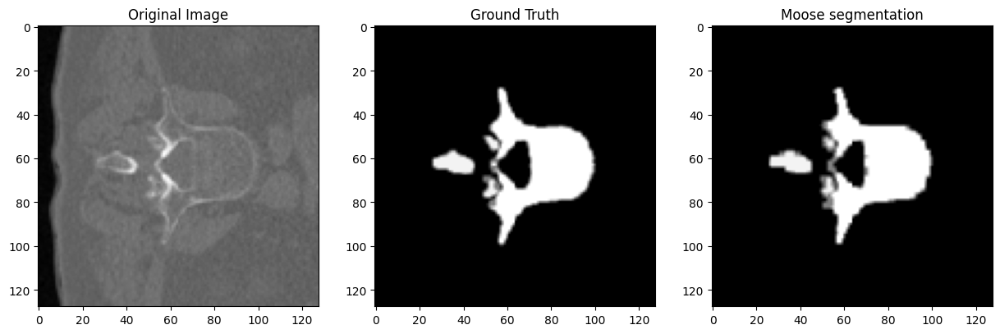

Dice Score for Pair 47: 0.6432958841323853
Image name: results_on_yes/sub-verse149/moosez-clin_ct_vertebrae-2024-07-14-22-05-41/segmentations/CT_Vertebrae_CT_sub-verse149_ct_0000.nii.gz


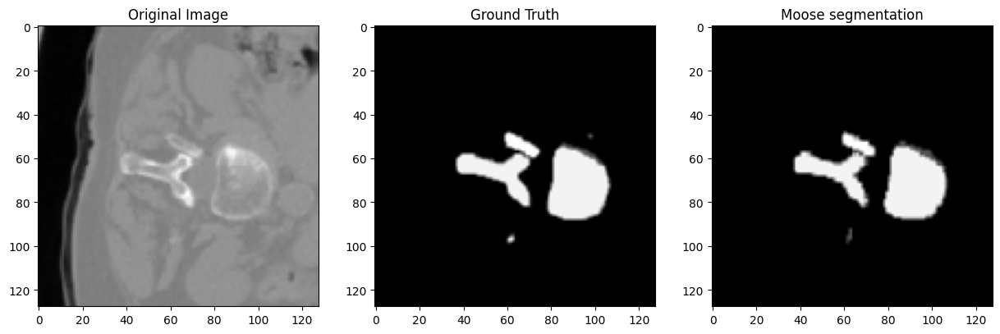

Dice Score for Pair 48: 0.5968695878982544
Image name: results_on_yes/sub-verse411_split-verse270/moosez-clin_ct_vertebrae-2024-07-14-21-40-50/segmentations/CT_Vertebrae_CT_sub-verse411_split-verse270_ct_0000.nii.gz


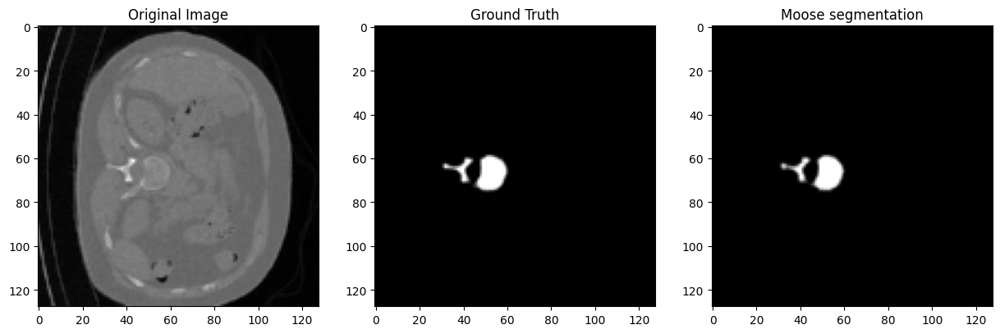

Dice Score for Pair 49: 0.7137681245803833
Image name: results_on_yes/sub-verse070/moosez-clin_ct_vertebrae-2024-07-14-19-26-35/segmentations/CT_Vertebrae_CT_sub-verse070_ct_0000.nii.gz


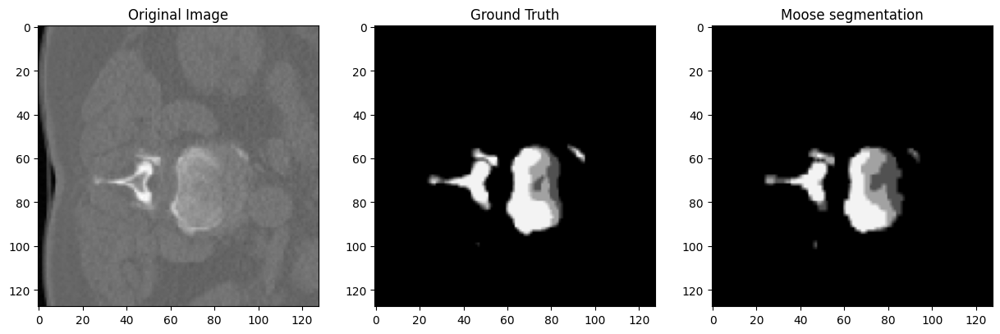

Dice Score for Pair 50: 0.5667390823364258
Image name: results_on_yes/sub-verse127/moosez-clin_ct_vertebrae-2024-07-14-20-03-28/segmentations/CT_Vertebrae_CT_sub-verse127_ct_0000.nii.gz


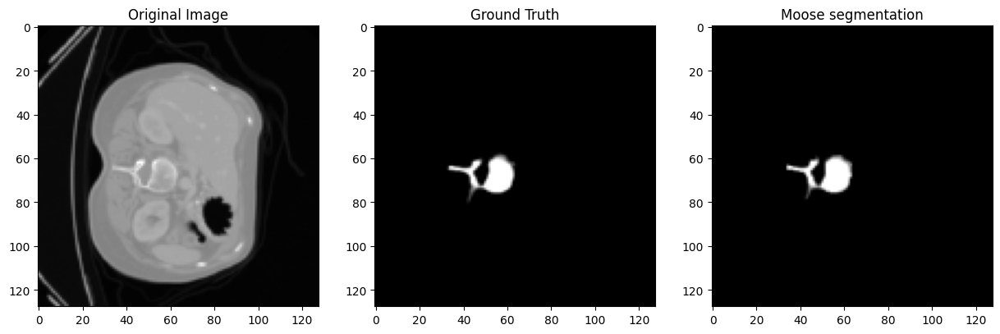

Dice Score for Pair 51: 0.41020289063453674
Image name: results_on_yes/sub-verse146/moosez-clin_ct_vertebrae-2024-07-14-22-06-44/segmentations/CT_Vertebrae_CT_sub-verse146_ct_0000.nii.gz


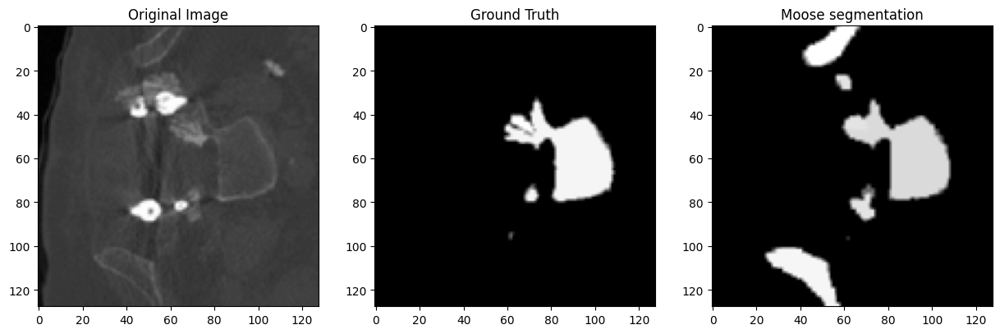

Dice Score for Pair 52: 0.6025640964508057
Image name: results_on_yes/sub-verse151/moosez-clin_ct_vertebrae-2024-07-14-19-28-11/segmentations/CT_Vertebrae_CT_sub-verse151_ct_0000.nii.gz


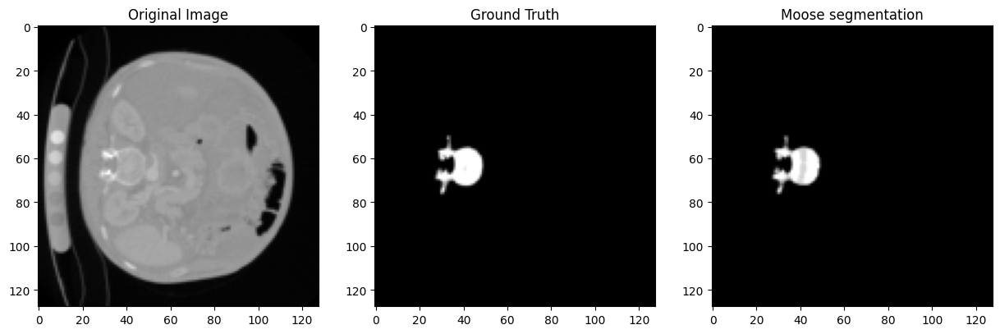

Dice Score for Pair 53: 0.8507869243621826
Image name: results_on_yes/sub-verse150/moosez-clin_ct_vertebrae-2024-07-14-22-10-29/segmentations/CT_Vertebrae_CT_sub-verse150_ct_0000.nii.gz


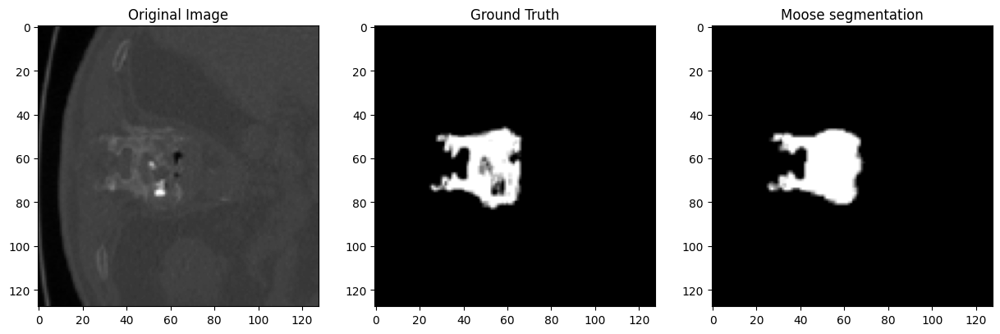

Dice Score for Pair 54: 0.7291111946105957
Image name: results_on_yes/sub-verse122/moosez-clin_ct_vertebrae-2024-07-15-01-15-32/segmentations/CT_Vertebrae_CT_sub-verse122_ct_0000.nii.gz


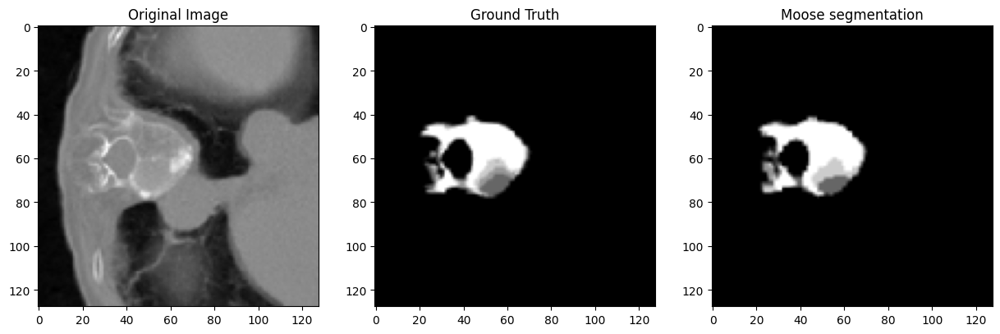

Dice Score for Pair 55: 0.4983513653278351
Image name: results_on_yes/sub-verse022/moosez-clin_ct_vertebrae-2024-07-14-20-52-28/segmentations/CT_Vertebrae_CT_sub-verse022_ct_0000.nii.gz


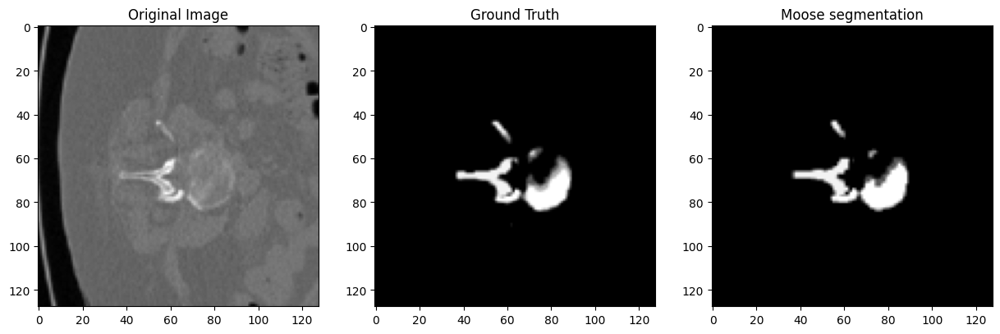

Dice Score for Pair 56: 0.8273094296455383
Image name: results_on_yes/sub-verse075/moosez-clin_ct_vertebrae-2024-07-14-23-03-16/segmentations/CT_Vertebrae_CT_sub-verse075_ct_0000.nii.gz


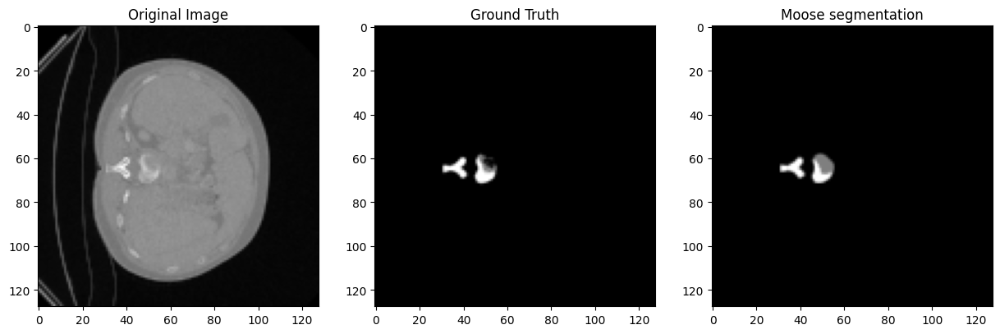

Dice Score for Pair 57: 0.8803418874740601
Image name: results_on_yes/sub-verse412_split-verse235/moosez-clin_ct_vertebrae-2024-07-14-23-22-52/segmentations/CT_Vertebrae_CT_sub-verse412_split-verse235_ct_0000.nii.gz


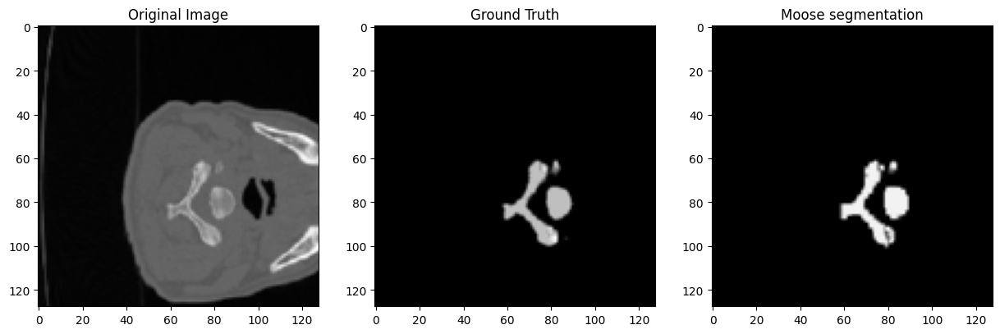

Dice Score for Pair 58: 0.8315529227256775
Image name: results_on_yes/sub-verse408_split-verse223/moosez-clin_ct_vertebrae-2024-07-14-19-56-17/segmentations/CT_Vertebrae_CT_sub-verse408_split-verse223_ct_0000.nii.gz


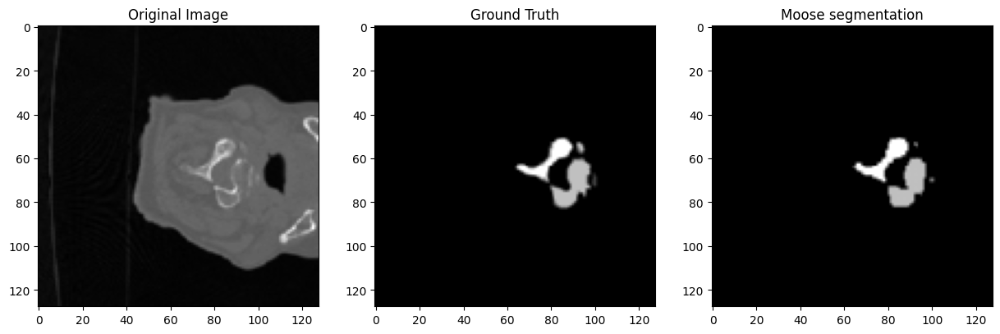

Dice Score for Pair 59: 0.8786534070968628
Image name: results_on_yes/sub-verse221/moosez-clin_ct_vertebrae-2024-07-15-01-29-18/segmentations/CT_Vertebrae_CT_sub-verse221_ct_0000.nii.gz


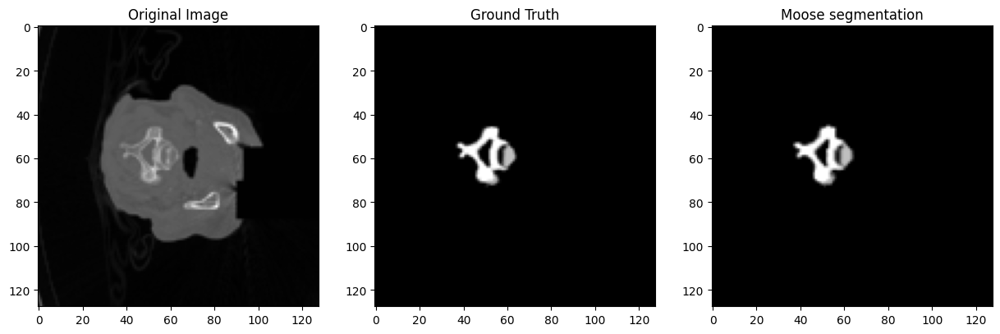

Dice Score for Pair 60: 0.6417720913887024
Image name: results_on_yes/sub-verse104/moosez-clin_ct_vertebrae-2024-07-14-19-45-40/segmentations/CT_Vertebrae_CT_sub-verse104_ct_0000.nii.gz


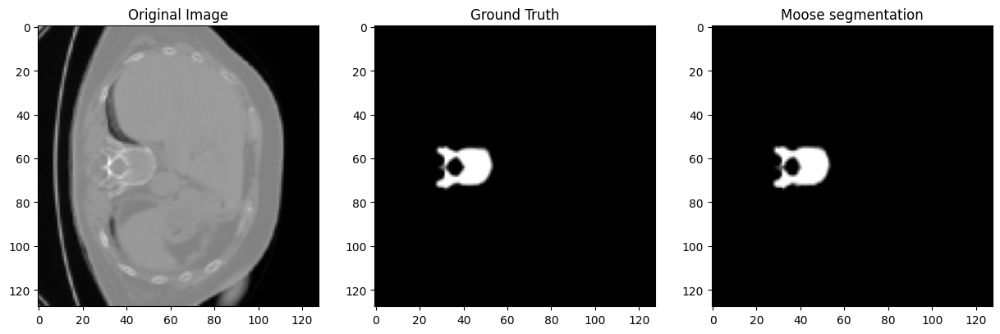

Dice Score for Pair 61: 0.611629068851471
Image name: results_on_yes/sub-verse409_split-verse266/moosez-clin_ct_vertebrae-2024-07-14-19-57-51/segmentations/CT_Vertebrae_CT_sub-verse409_split-verse266_ct_0000.nii.gz


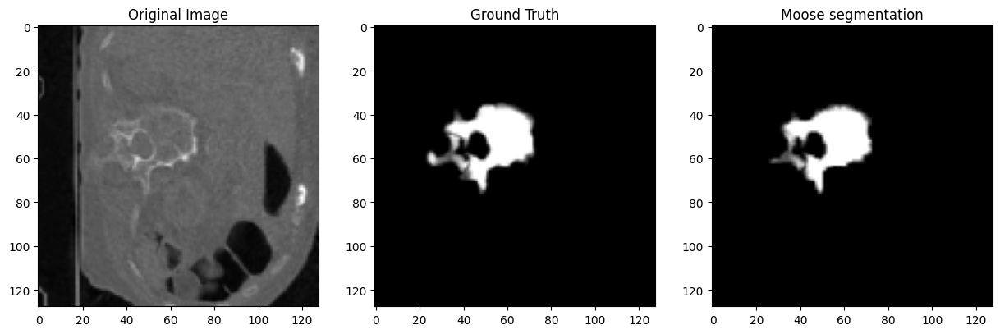

In [5]:
# Define MONAI transforms
transforms = Compose([
    LoadImage(image_only=True),
    EnsureChannelFirst(),
    ScaleIntensity(),
    Resize(spatial_size=common_size),  # Resize all images to the common size
    ToTensor()
])

# Create datasets
segmentation_dataset = Dataset(data=segmentation_files, transform=transforms)
ground_truth_dataset = Dataset(data=ground_truth_files, transform=transforms)
original_dataset = Dataset(data=original_files, transform=transforms)

# Create data loaders
segmentation_loader = DataLoader(segmentation_dataset, batch_size=1, num_workers=2)
ground_truth_loader = DataLoader(ground_truth_dataset, batch_size=1, num_workers=2)
original_loader = DataLoader(original_dataset, batch_size=1, num_workers=2)

# Initialize Dice metric
dice_metric = DiceMetric(include_background=False, reduction="mean")

dice_values = []

# Compute Dice metric for each pair of images and visualize them
for i, (seg_images, gt_images, orig_images) in enumerate(zip(segmentation_loader, ground_truth_loader, original_loader)):
    # Apply threshold to convert probabilistic images to binary
    seg_images_binary = (seg_images > 0).float()
    gt_images_binary = (gt_images > 0).float()

    # Calculate Dice score
    dice_metric(seg_images_binary, gt_images_binary)

    dice_values.append(dice_metric.aggregate().item())
    print(f"Dice Score for Pair {i}: {dice_metric.aggregate().item()}")
    print(f"Image name: {segmentation_files[i]}")

    dice_metric.reset()

    # Convert tensors to numpy arrays for visualization
    # seg_image_np = seg_images_binary.numpy()[0, 0, :, :, :]  # Assuming 3D volume
    # gt_image_np = gt_images_binary.numpy()[0, 0, :, :, :]
    # orig_image_np = orig_images.numpy()[0, 0, :, :, :]
    seg_image_np = seg_images.numpy()[0, 0, :, :, :]  # Assuming 3D volume
    gt_image_np = gt_images.numpy()[0, 0, :, :, :]
    orig_image_np = orig_images.numpy()[0, 0, :, :, :]

    # Plot the middle slice of each volume
    middle_slice = common_size[2] // 2

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(orig_image_np[:, :, middle_slice], cmap='gray')
    # plt.imshow(orig_image_np[middle_slice, :, :], cmap='gray')
    plt.subplot(1, 3, 2)
    plt.title("Ground Truth")
    plt.imshow(gt_image_np[:, :, middle_slice], cmap='gray')
    # plt.imshow(gt_image_np[middle_slice, :, :], cmap='gray')
    plt.subplot(1, 3, 3)
    plt.title("Moose segmentation")
    plt.imshow(seg_image_np[:, :, middle_slice], cmap='gray')
    # plt.imshow(seg_image_np[middle_slice, :, :], cmap='gray')
    plt.show()


Dice Score for Pair 0: 0.8897290229797363
Image name: results_on_yes/sub-verse413_split-verse239/moosez-clin_ct_vertebrae-2024-07-14-20-17-33/segmentations/CT_Vertebrae_CT_sub-verse413_split-verse239_ct_0000.nii.gz


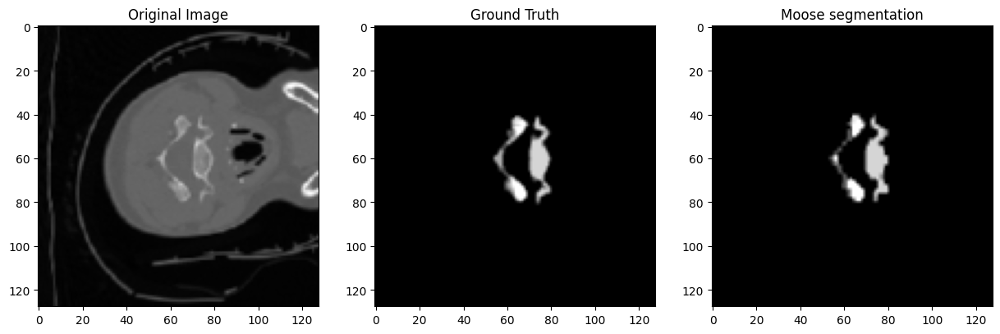

Dice Score for Pair 1: 0.5781662464141846
Image name: results_on_yes/sub-verse096/moosez-clin_ct_vertebrae-2024-07-14-23-46-48/segmentations/CT_Vertebrae_CT_sub-verse096_ct_0000.nii.gz


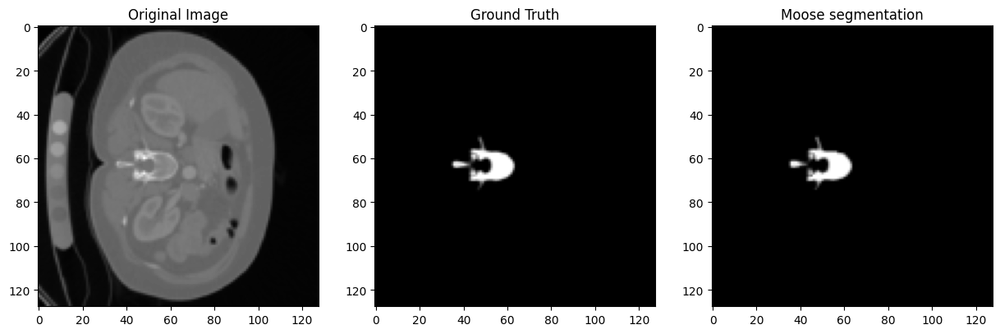

Dice Score for Pair 2: 0.627386212348938
Image name: results_on_yes/sub-verse271/moosez-clin_ct_vertebrae-2024-07-14-21-55-23/segmentations/CT_Vertebrae_CT_sub-verse271_ct_0000.nii.gz


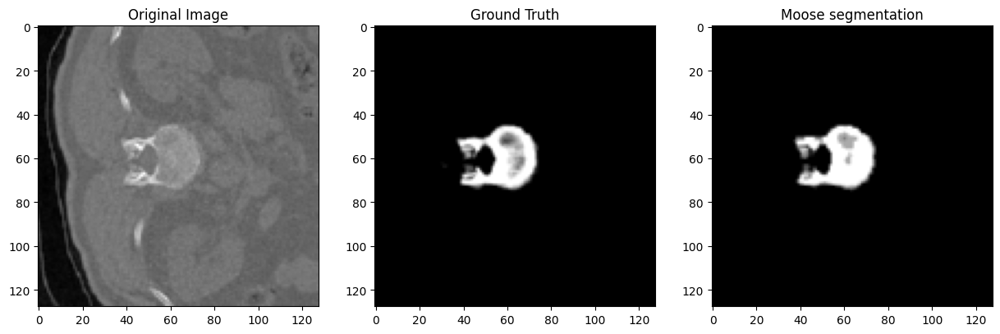

Dice Score for Pair 3: 0.5617055296897888
Image name: results_on_yes/sub-verse088/moosez-clin_ct_vertebrae-2024-07-14-22-57-07/segmentations/CT_Vertebrae_CT_sub-verse088_ct_0000.nii.gz


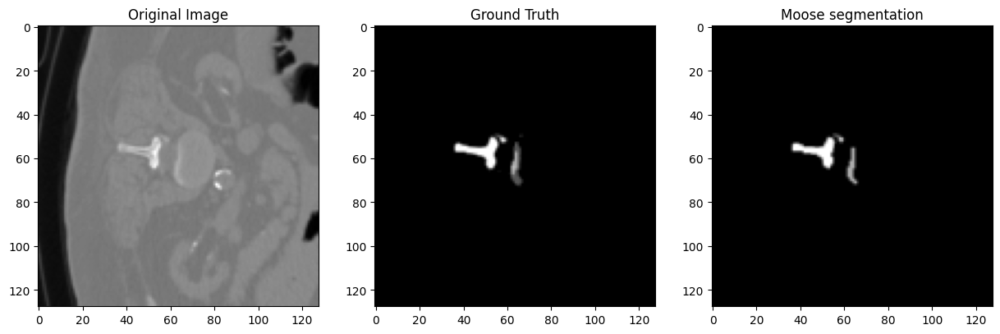

Dice Score for Pair 4: 0.8409313559532166
Image name: results_on_yes/sub-verse230/moosez-clin_ct_vertebrae-2024-07-15-00-07-53/segmentations/CT_Vertebrae_CT_sub-verse230_ct_0000.nii.gz


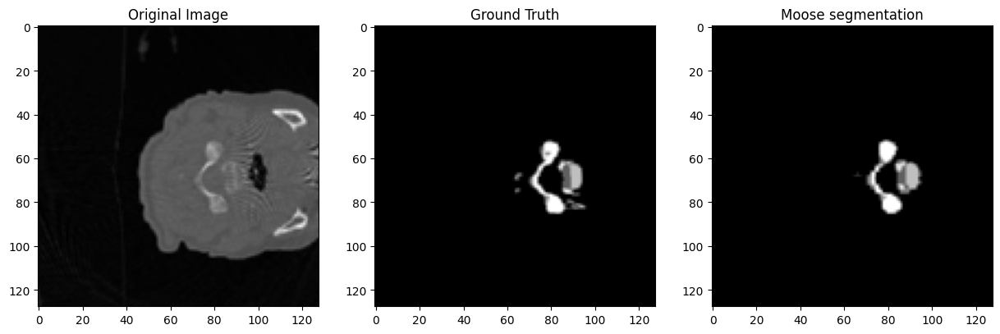

Dice Score for Pair 5: 0.6077131032943726
Image name: results_on_yes/sub-verse097/moosez-clin_ct_vertebrae-2024-07-14-22-38-59/segmentations/CT_Vertebrae_CT_sub-verse097_ct_0000.nii.gz


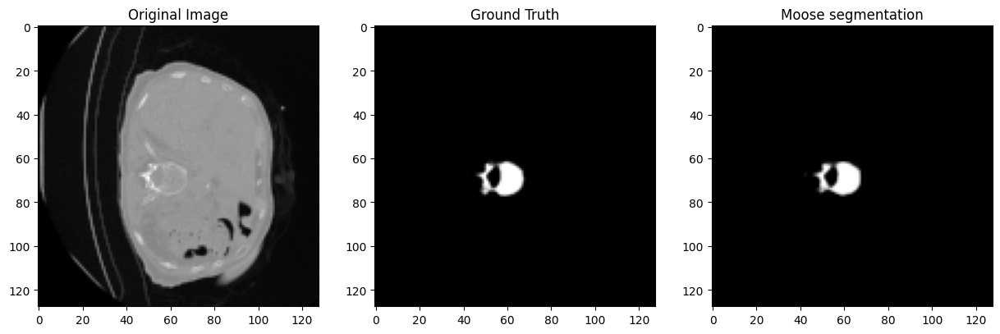

Dice Score for Pair 6: 0.7756457328796387
Image name: results_on_yes/sub-verse080/moosez-clin_ct_vertebrae-2024-07-15-00-42-12/segmentations/CT_Vertebrae_CT_sub-verse080_ct_0000.nii.gz


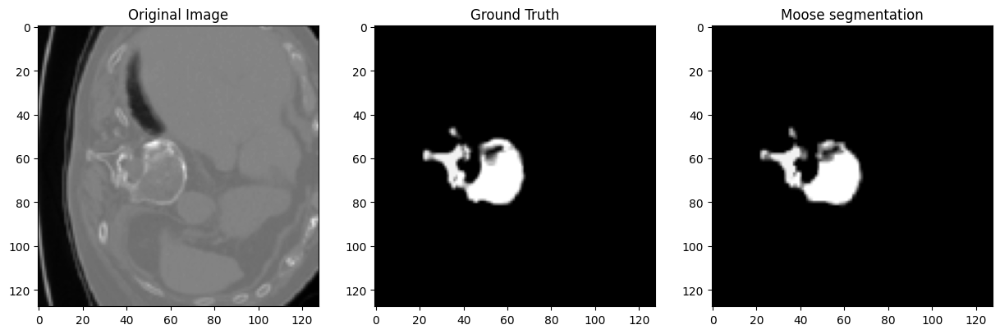

Dice Score for Pair 7: 0.564998209476471
Image name: results_on_yes/sub-verse072/moosez-clin_ct_vertebrae-2024-07-15-00-09-26/segmentations/CT_Vertebrae_CT_sub-verse072_ct_0000.nii.gz


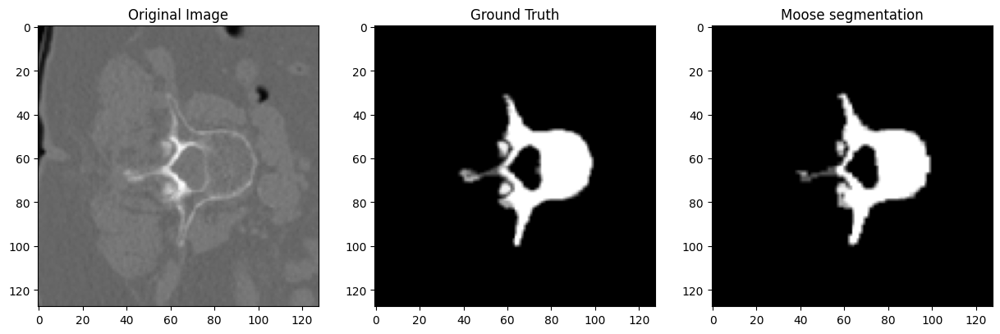

Dice Score for Pair 8: 0.6024006009101868
Image name: results_on_yes/sub-verse408_split-verse265/moosez-clin_ct_vertebrae-2024-07-14-20-33-01/segmentations/CT_Vertebrae_CT_sub-verse408_split-verse265_ct_0000.nii.gz


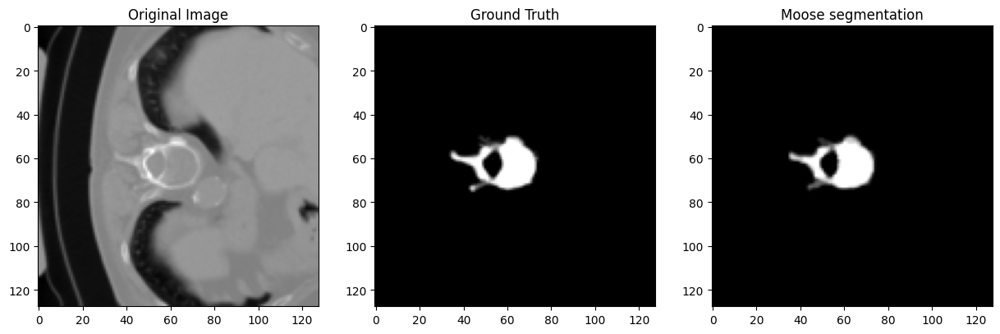

Dice Score for Pair 9: 0.49399763345718384
Image name: results_on_yes/sub-verse073/moosez-clin_ct_vertebrae-2024-07-14-22-08-17/segmentations/CT_Vertebrae_CT_sub-verse073_ct_0000.nii.gz


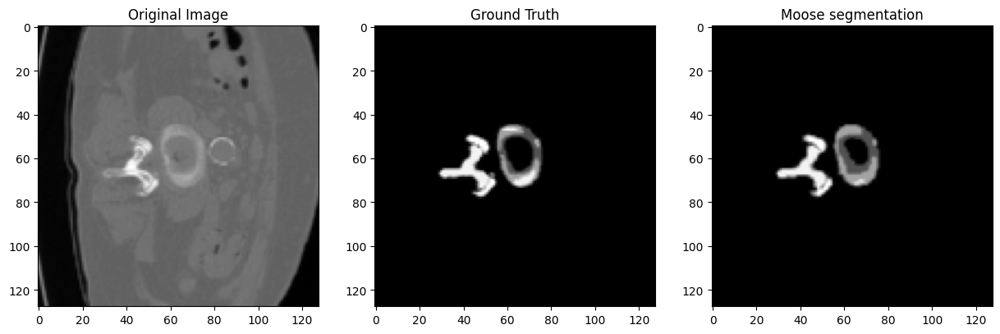

Dice Score for Pair 10: 0.8247114419937134
Image name: results_on_yes/sub-verse410_split-verse227/moosez-clin_ct_vertebrae-2024-07-14-23-24-28/segmentations/CT_Vertebrae_CT_sub-verse410_split-verse227_ct_0000.nii.gz


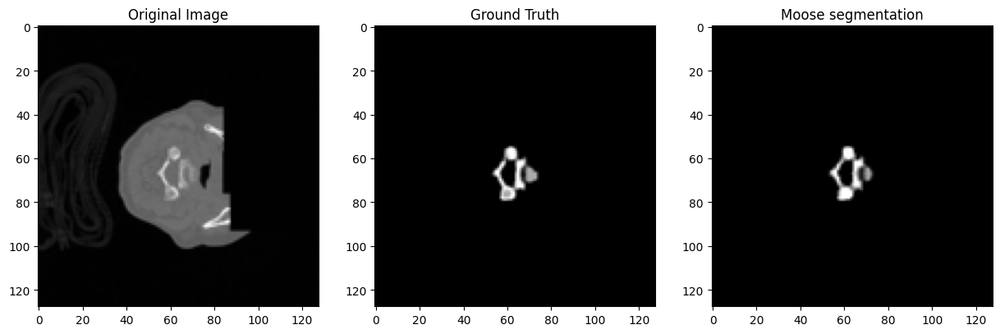

Dice Score for Pair 11: 0.33127066493034363
Image name: results_on_yes/sub-verse051/moosez-clin_ct_vertebrae-2024-07-14-23-27-27/segmentations/CT_Vertebrae_CT_sub-verse051_ct_0000.nii.gz


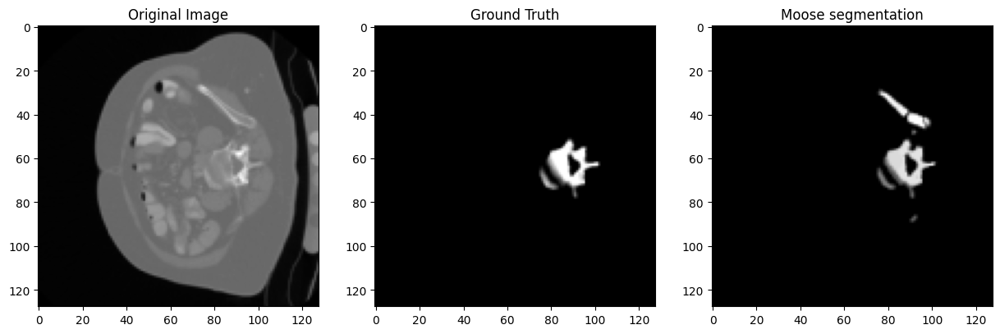

Dice Score for Pair 12: 0.5977110862731934
Image name: results_on_yes/sub-verse101/moosez-clin_ct_vertebrae-2024-07-15-00-28-02/segmentations/CT_Vertebrae_CT_sub-verse101_ct_0000.nii.gz


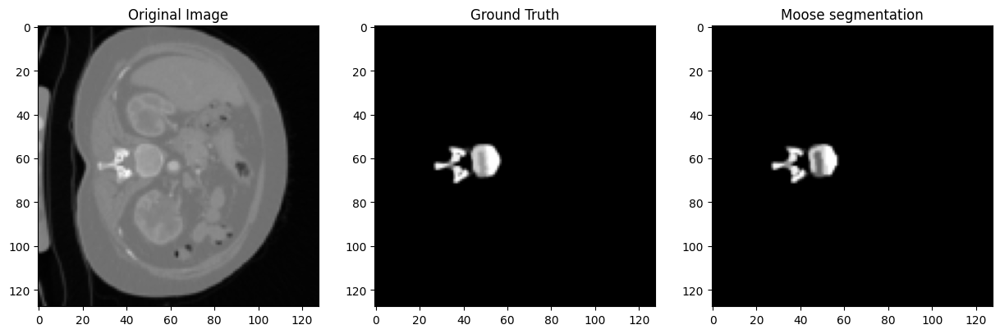

Dice Score for Pair 13: 0.6182160973548889
Image name: results_on_yes/sub-verse138/moosez-clin_ct_vertebrae-2024-07-14-19-09-27/segmentations/CT_Vertebrae_CT_sub-verse138_ct_0000.nii.gz


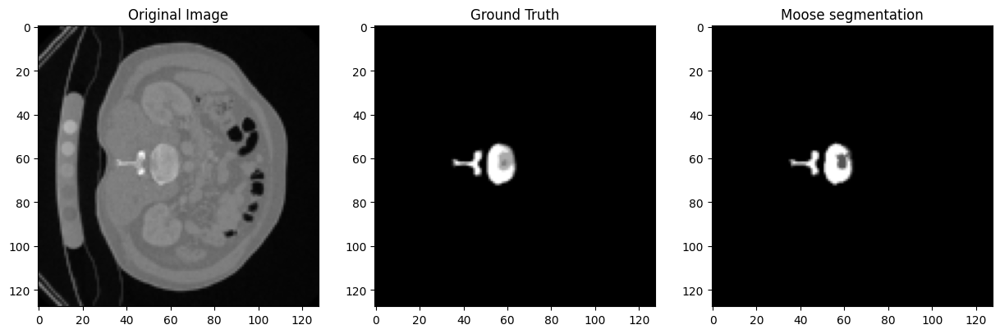

Dice Score for Pair 14: 0.8768226504325867
Image name: results_on_yes/sub-verse225/moosez-clin_ct_vertebrae-2024-07-14-19-04-38/segmentations/CT_Vertebrae_CT_sub-verse225_ct_0000.nii.gz


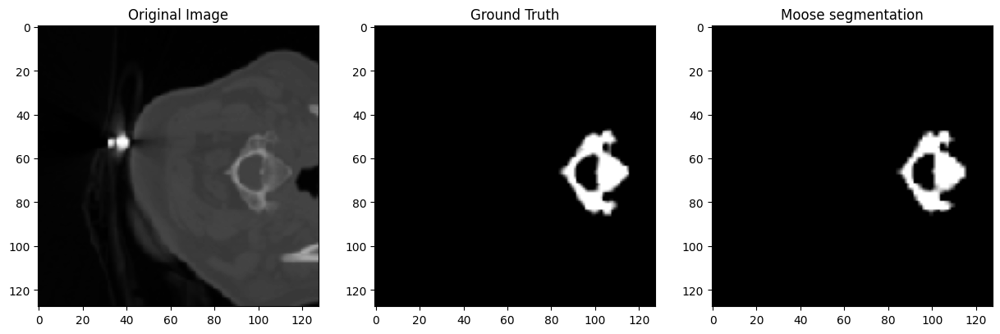

Dice Score for Pair 15: 0.7987690567970276
Image name: results_on_yes/sub-verse100/moosez-clin_ct_vertebrae-2024-07-15-00-50-03/segmentations/CT_Vertebrae_CT_sub-verse100_ct_0000.nii.gz


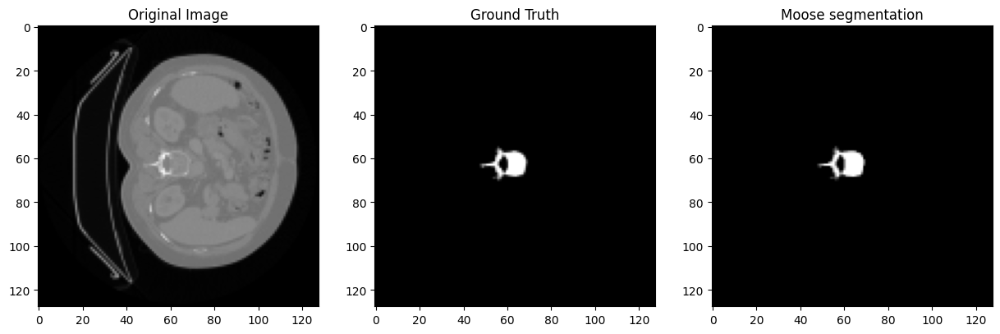

Dice Score for Pair 16: 0.6158541440963745
Image name: results_on_yes/sub-verse413_split-verse272/moosez-clin_ct_vertebrae-2024-07-15-00-46-02/segmentations/CT_Vertebrae_CT_sub-verse413_split-verse272_ct_0000.nii.gz


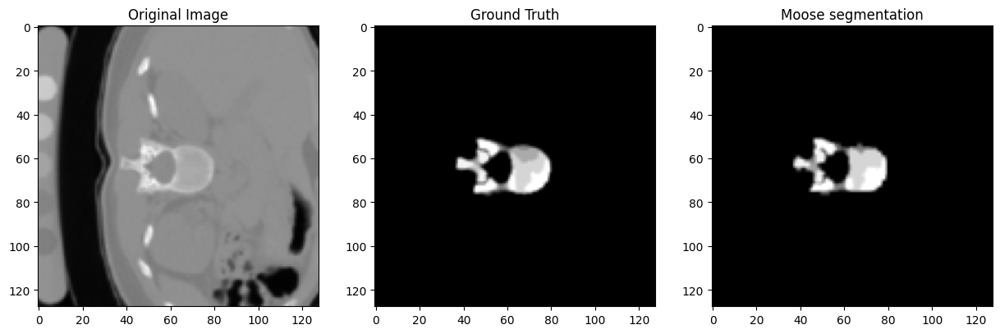

Dice Score for Pair 17: 0.8866528868675232
Image name: results_on_yes/sub-verse105/moosez-clin_ct_vertebrae-2024-07-14-22-01-03/segmentations/CT_Vertebrae_CT_sub-verse105_ct_0000.nii.gz


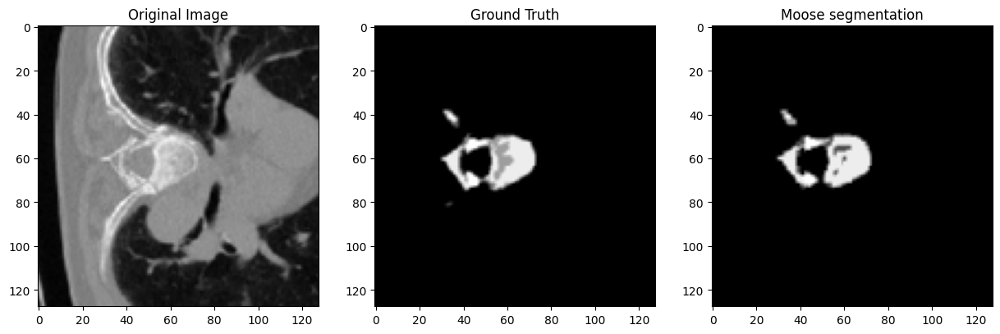

Dice Score for Pair 18: 0.6818040013313293
Image name: results_on_yes/sub-verse269/moosez-clin_ct_vertebrae-2024-07-14-19-06-42/segmentations/CT_Vertebrae_CT_sub-verse269_ct_0000.nii.gz


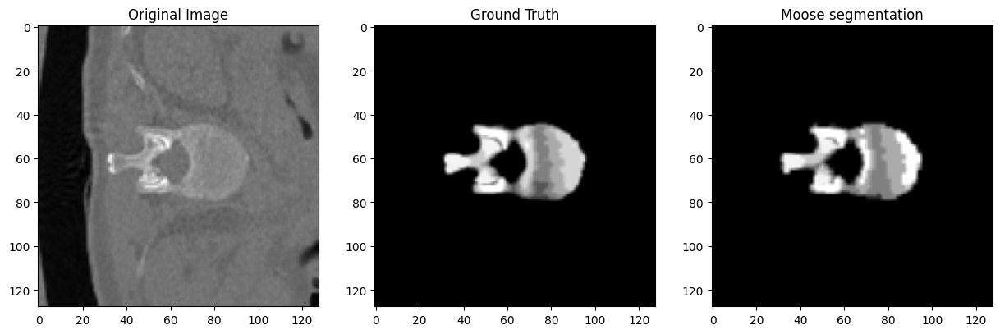

Dice Score for Pair 19: 0.5970391035079956
Image name: results_on_yes/sub-verse111/moosez-clin_ct_vertebrae-2024-07-14-19-03-03/segmentations/CT_Vertebrae_CT_sub-verse111_ct_0000.nii.gz


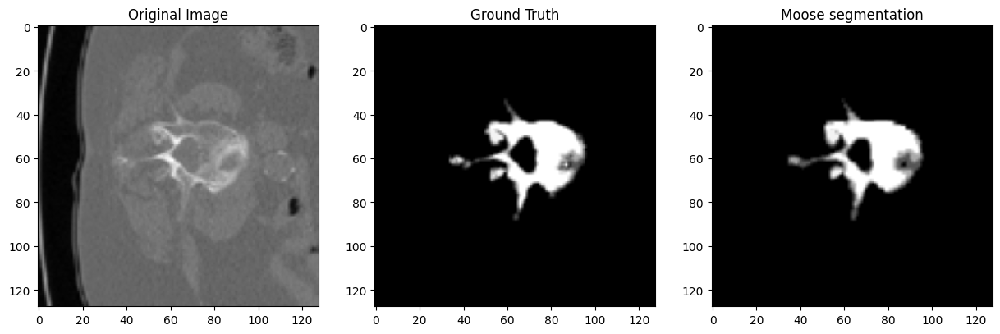

Dice Score for Pair 20: 0.725104570388794
Image name: results_on_yes/sub-verse130/moosez-clin_ct_vertebrae-2024-07-14-23-20-12/segmentations/CT_Vertebrae_CT_sub-verse130_ct_0000.nii.gz


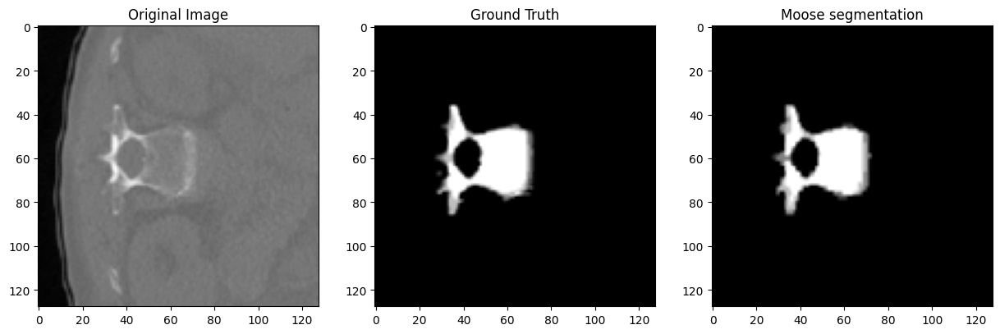

Dice Score for Pair 21: 0.5789830088615417
Image name: results_on_yes/sub-verse143/moosez-clin_ct_vertebrae-2024-07-14-20-54-03/segmentations/CT_Vertebrae_CT_sub-verse143_ct_0000.nii.gz


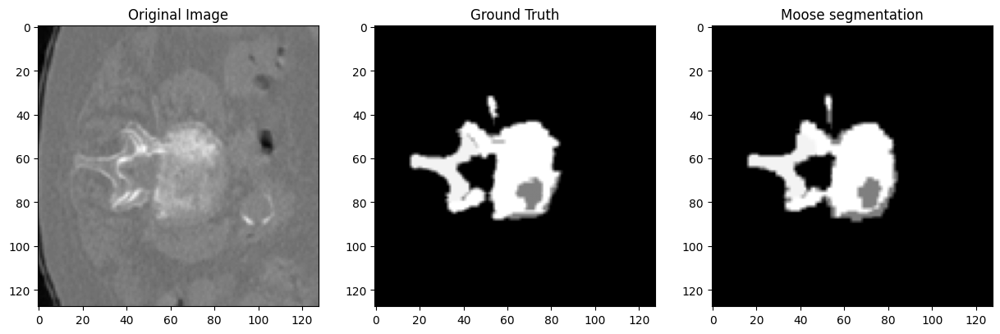

Dice Score for Pair 22: 0.5408457517623901
Image name: results_on_yes/sub-verse063/moosez-clin_ct_vertebrae-2024-07-14-20-55-03/segmentations/CT_Vertebrae_CT_sub-verse063_ct_0000.nii.gz


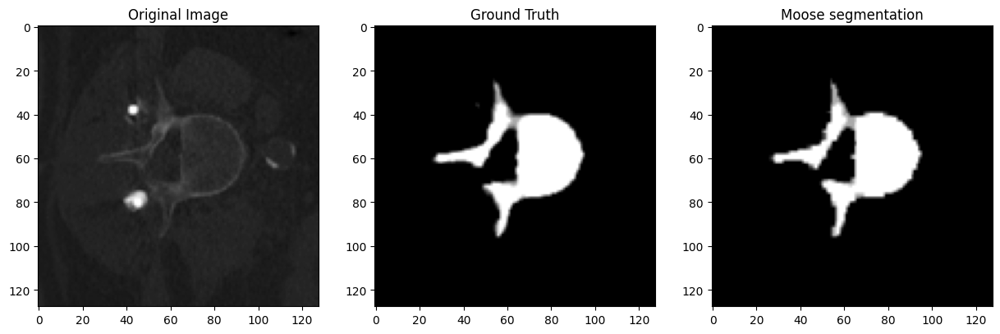

Dice Score for Pair 23: 0.10747791826725006
Image name: results_on_yes/sub-verse116/moosez-clin_ct_vertebrae-2024-07-14-21-14-11/segmentations/CT_Vertebrae_CT_sub-verse116_ct_0000.nii.gz


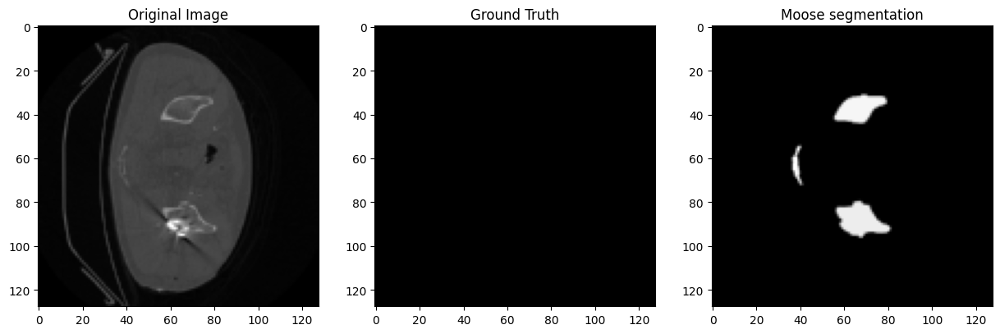

Dice Score for Pair 24: 0.8049150705337524
Image name: results_on_yes/sub-verse081/moosez-clin_ct_vertebrae-2024-07-15-00-05-51/segmentations/CT_Vertebrae_CT_sub-verse081_ct_0000.nii.gz


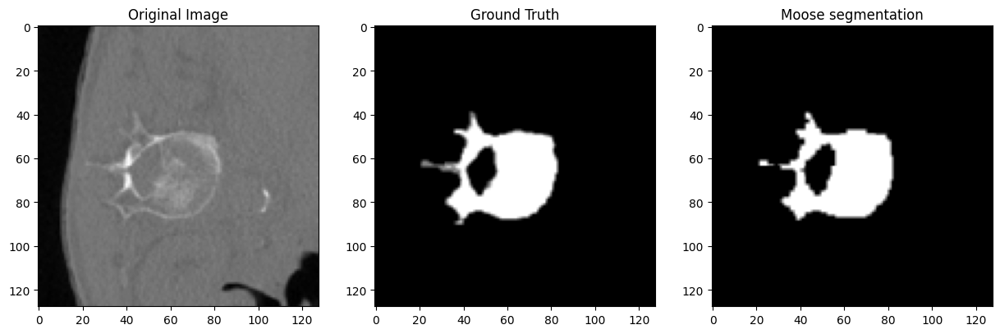

Dice Score for Pair 25: 0.47679832577705383
Image name: results_on_yes/sub-verse133/moosez-clin_ct_vertebrae-2024-07-14-22-17-25/segmentations/CT_Vertebrae_CT_sub-verse133_ct_0000.nii.gz


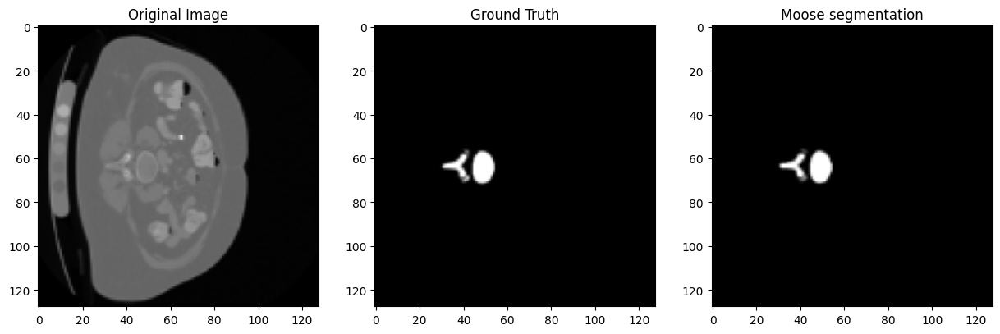

Dice Score for Pair 26: 0.410284161567688
Image name: results_on_yes/sub-verse071/moosez-clin_ct_vertebrae-2024-07-14-20-38-43/segmentations/CT_Vertebrae_CT_sub-verse071_ct_0000.nii.gz


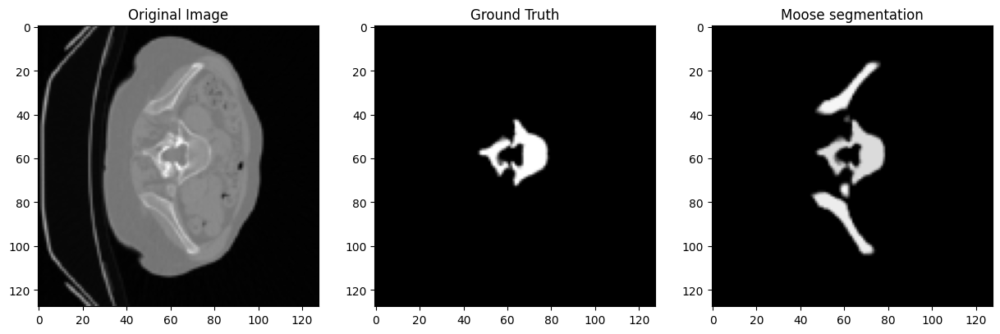

Dice Score for Pair 27: 0.8669998049736023
Image name: results_on_yes/sub-verse125/moosez-clin_ct_vertebrae-2024-07-14-21-00-27/segmentations/CT_Vertebrae_CT_sub-verse125_ct_0000.nii.gz


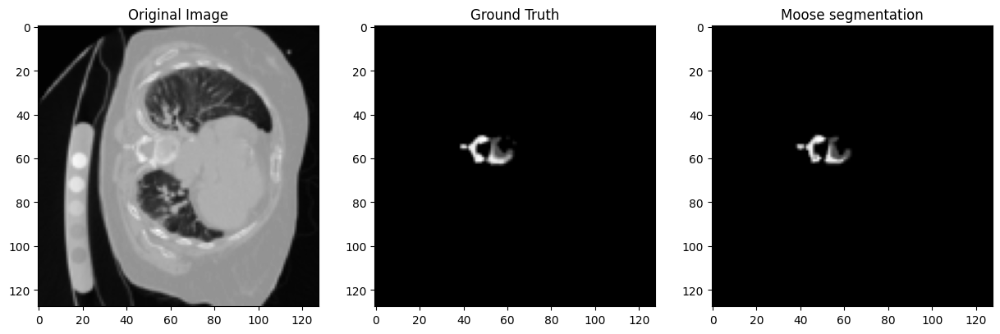

Dice Score for Pair 28: 0.5622529983520508
Image name: results_on_yes/sub-verse144/moosez-clin_ct_vertebrae-2024-07-15-01-23-27/segmentations/CT_Vertebrae_CT_sub-verse144_ct_0000.nii.gz


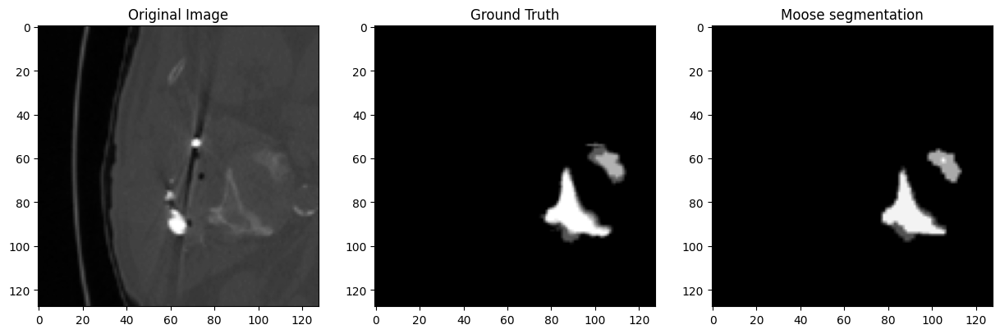

Dice Score for Pair 29: 0.8173441290855408
Image name: results_on_yes/sub-verse411_split-verse232/moosez-clin_ct_vertebrae-2024-07-14-23-00-57/segmentations/CT_Vertebrae_CT_sub-verse411_split-verse232_ct_0000.nii.gz


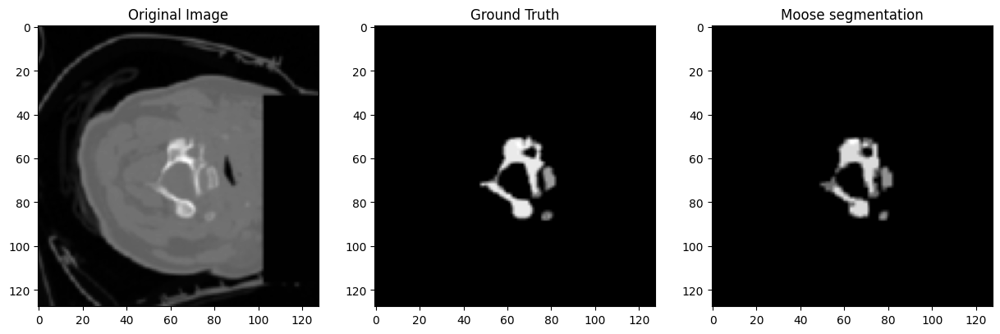

Dice Score for Pair 30: 0.6230134963989258
Image name: results_on_yes/sub-verse410_split-verse267/moosez-clin_ct_vertebrae-2024-07-14-21-51-33/segmentations/CT_Vertebrae_CT_sub-verse410_split-verse267_ct_0000.nii.gz


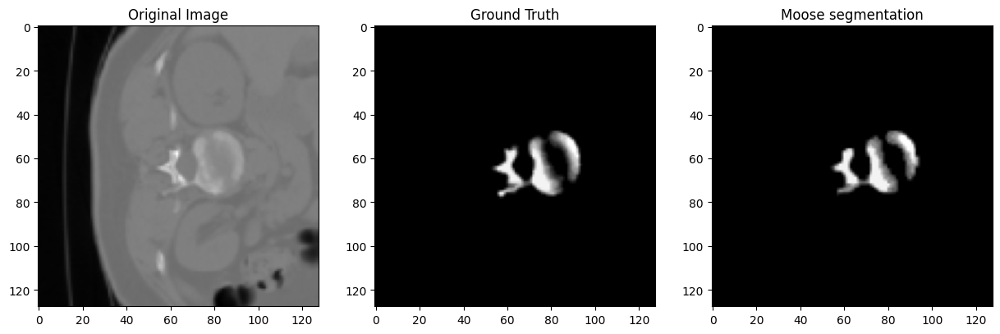

Dice Score for Pair 31: 0.531020998954773
Image name: results_on_yes/sub-verse113/moosez-clin_ct_vertebrae-2024-07-14-22-12-04/segmentations/CT_Vertebrae_CT_sub-verse113_ct_0000.nii.gz


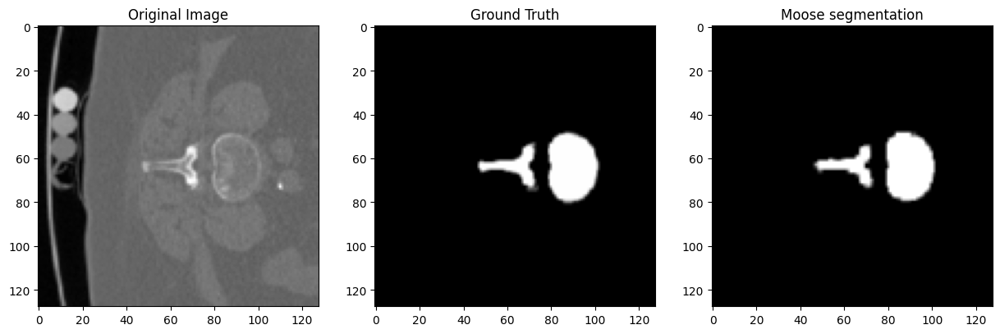

Dice Score for Pair 32: 0.6354546546936035
Image name: results_on_yes/sub-verse412_split-verse290/moosez-clin_ct_vertebrae-2024-07-15-01-17-42/segmentations/CT_Vertebrae_CT_sub-verse412_split-verse290_ct_0000.nii.gz


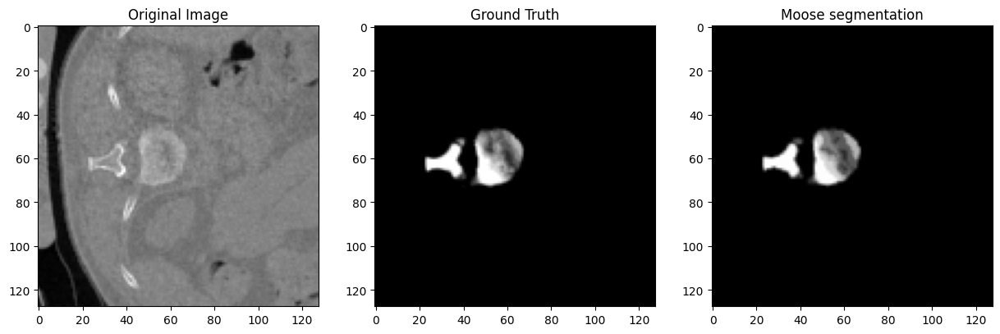

Dice Score for Pair 33: 0.8859193325042725
Image name: results_on_yes/sub-verse409_split-verse226/moosez-clin_ct_vertebrae-2024-07-14-22-02-38/segmentations/CT_Vertebrae_CT_sub-verse409_split-verse226_ct_0000.nii.gz


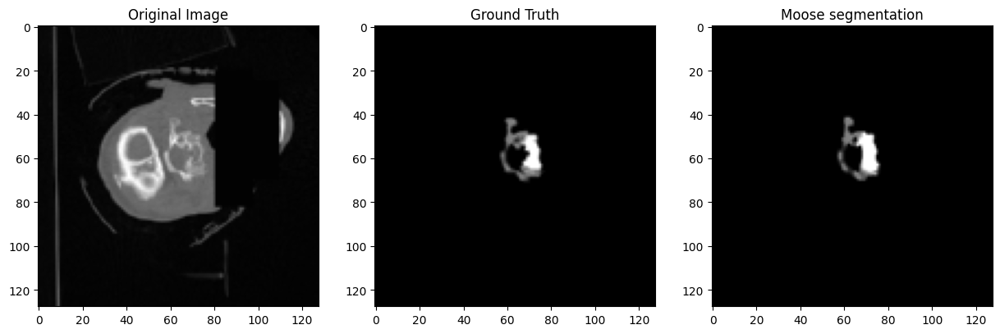

Dice Score for Pair 34: 0.5805936455726624
Image name: results_on_yes/sub-verse152/moosez-clin_ct_vertebrae-2024-07-15-01-27-41/segmentations/CT_Vertebrae_CT_sub-verse152_ct_0000.nii.gz


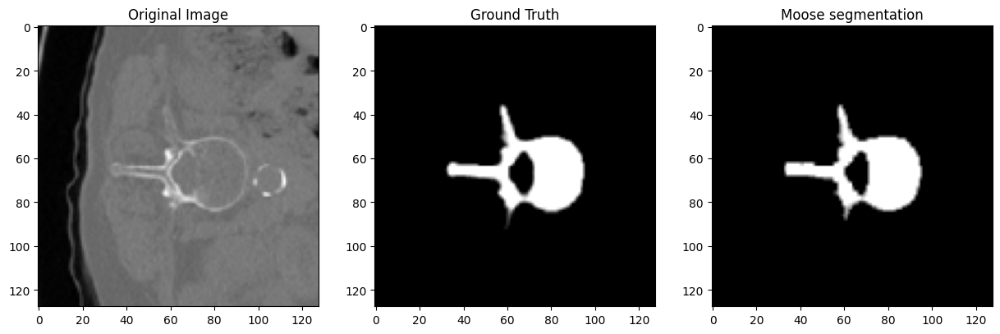

Dice Score for Pair 35: 0.45269113779067993
Image name: results_on_yes/sub-verse102/moosez-clin_ct_vertebrae-2024-07-14-20-57-45/segmentations/CT_Vertebrae_CT_sub-verse102_ct_0000.nii.gz


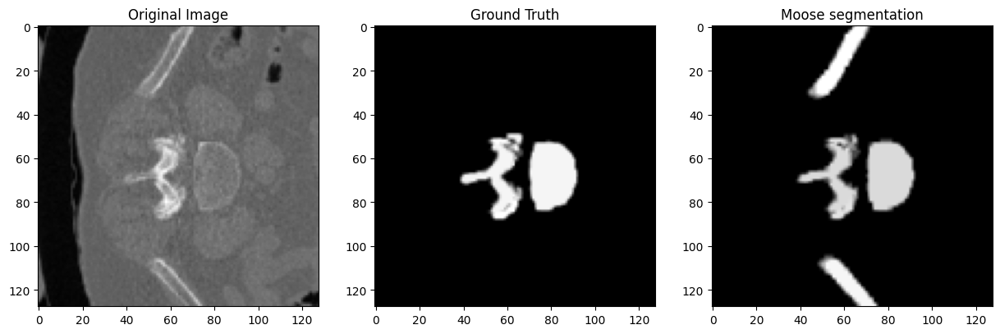

Dice Score for Pair 36: 0.5943877696990967
Image name: results_on_yes/sub-verse137/moosez-clin_ct_vertebrae-2024-07-14-21-39-15/segmentations/CT_Vertebrae_CT_sub-verse137_ct_0000.nii.gz


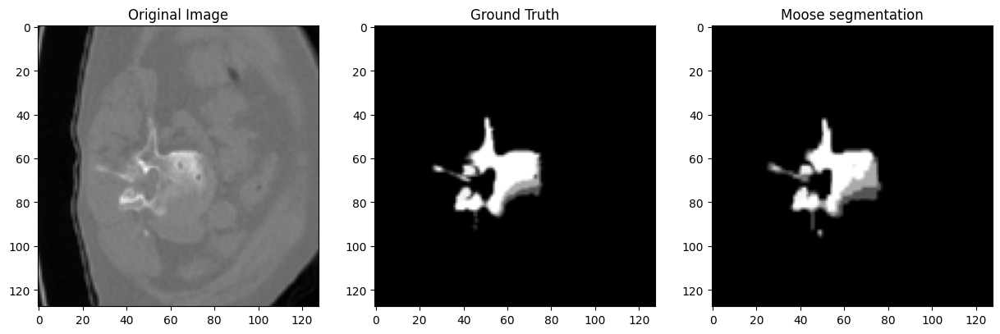

Dice Score for Pair 37: 0.8582088351249695
Image name: results_on_yes/sub-verse112/moosez-clin_ct_vertebrae-2024-07-14-20-19-07/segmentations/CT_Vertebrae_CT_sub-verse112_ct_0000.nii.gz


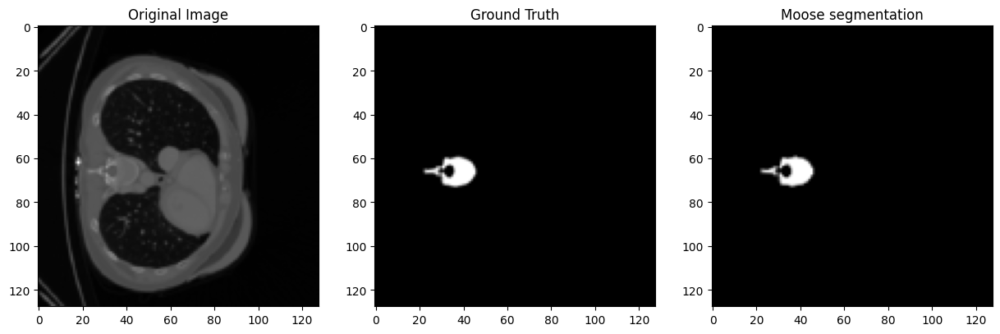

Dice Score for Pair 38: 0.5106135606765747
Image name: results_on_yes/sub-verse124/moosez-clin_ct_vertebrae-2024-07-15-00-04-12/segmentations/CT_Vertebrae_CT_sub-verse124_ct_0000.nii.gz


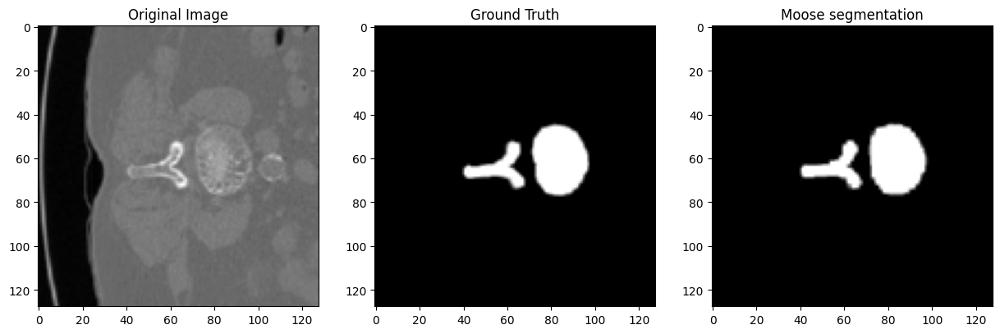

Dice Score for Pair 39: 0.6602481603622437
Image name: results_on_yes/sub-verse134/moosez-clin_ct_vertebrae-2024-07-15-00-06-52/segmentations/CT_Vertebrae_CT_sub-verse134_ct_0000.nii.gz


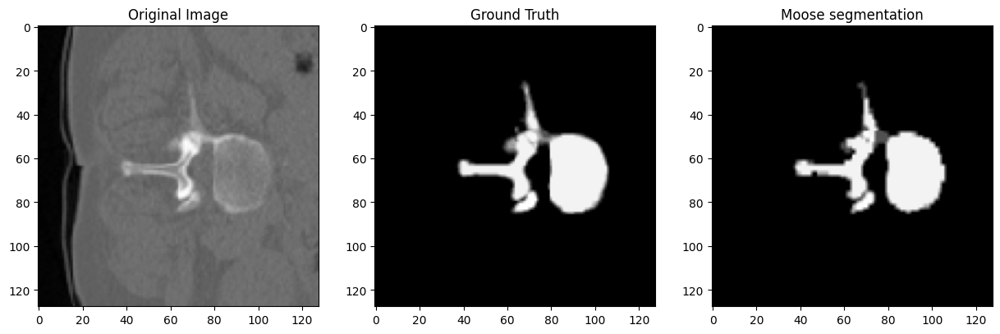

Dice Score for Pair 40: 0.596752405166626
Image name: results_on_yes/sub-verse085/moosez-clin_ct_vertebrae-2024-07-15-01-26-08/segmentations/CT_Vertebrae_CT_sub-verse085_ct_0000.nii.gz


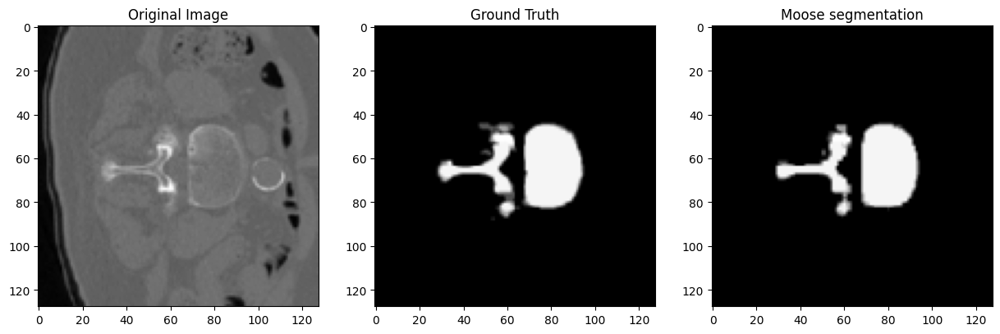

Dice Score for Pair 41: 0.6651078462600708
Image name: results_on_yes/sub-verse147/moosez-clin_ct_vertebrae-2024-07-14-23-02-31/segmentations/CT_Vertebrae_CT_sub-verse147_ct_0000.nii.gz


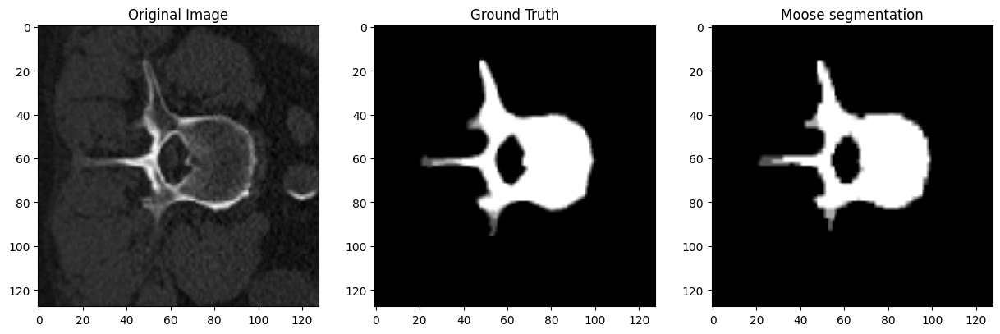

Dice Score for Pair 42: 0.8925895094871521
Image name: results_on_yes/sub-verse217/moosez-clin_ct_vertebrae-2024-07-14-23-44-41/segmentations/CT_Vertebrae_CT_sub-verse217_ct_0000.nii.gz


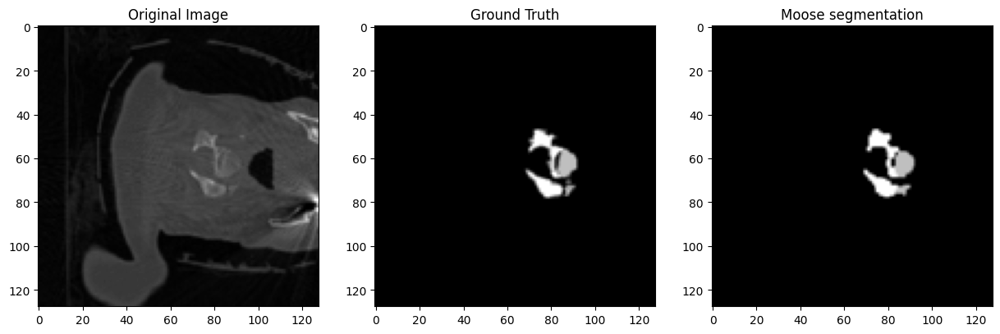

Dice Score for Pair 43: 0.5627692341804504
Image name: results_on_yes/sub-verse401_split-verse253/moosez-clin_ct_vertebrae-2024-07-15-00-10-28/segmentations/CT_Vertebrae_CT_sub-verse401_split-verse253_ct_0000.nii.gz


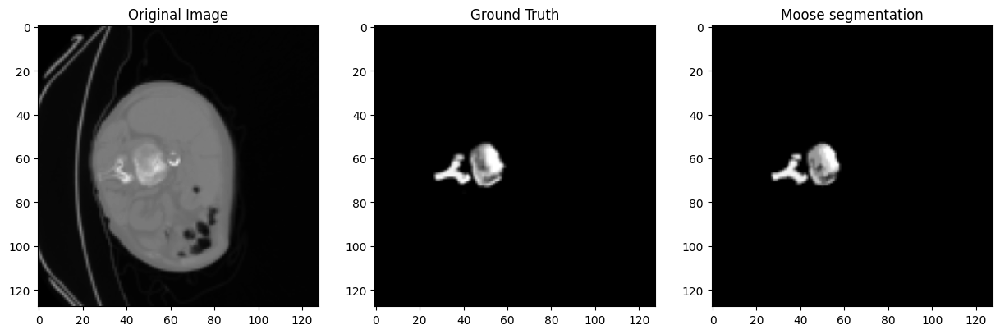

Dice Score for Pair 44: 0.44511687755584717
Image name: results_on_yes/sub-verse107/moosez-clin_ct_vertebrae-2024-07-14-18-52-33/segmentations/CT_Vertebrae_CT_sub-verse107_ct_0000.nii.gz


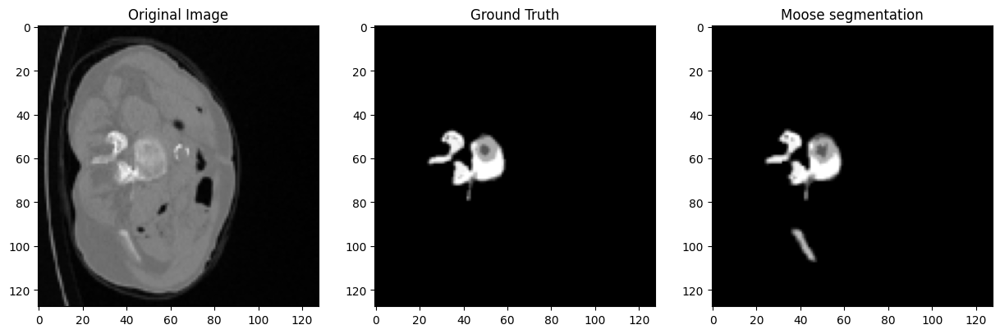

Dice Score for Pair 45: 0.5890316963195801
Image name: results_on_yes/sub-verse093/moosez-clin_ct_vertebrae-2024-07-14-22-13-38/segmentations/CT_Vertebrae_CT_sub-verse093_ct_0000.nii.gz


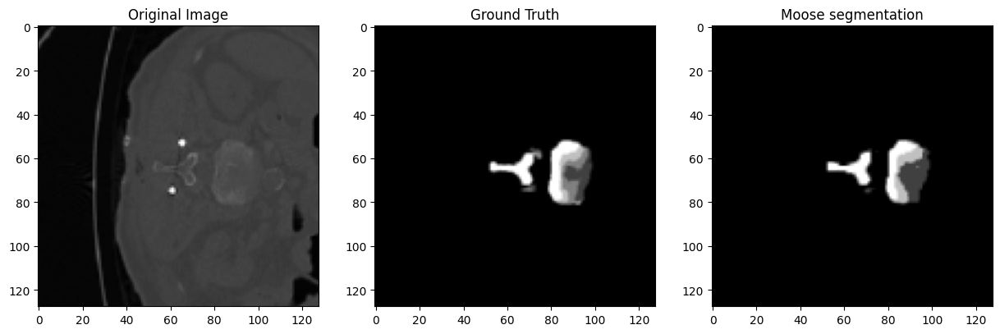

Dice Score for Pair 46: 0.7018632292747498
Image name: results_on_yes/sub-verse078/moosez-clin_ct_vertebrae-2024-07-14-19-05-40/segmentations/CT_Vertebrae_CT_sub-verse078_ct_0000.nii.gz


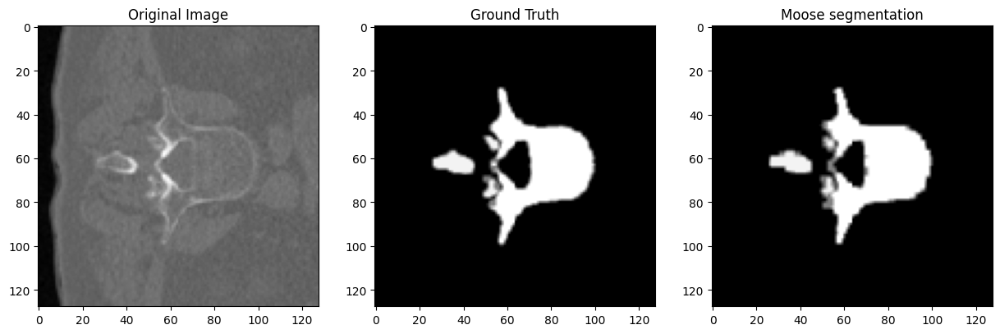

Dice Score for Pair 47: 0.6432958841323853
Image name: results_on_yes/sub-verse149/moosez-clin_ct_vertebrae-2024-07-14-22-05-41/segmentations/CT_Vertebrae_CT_sub-verse149_ct_0000.nii.gz


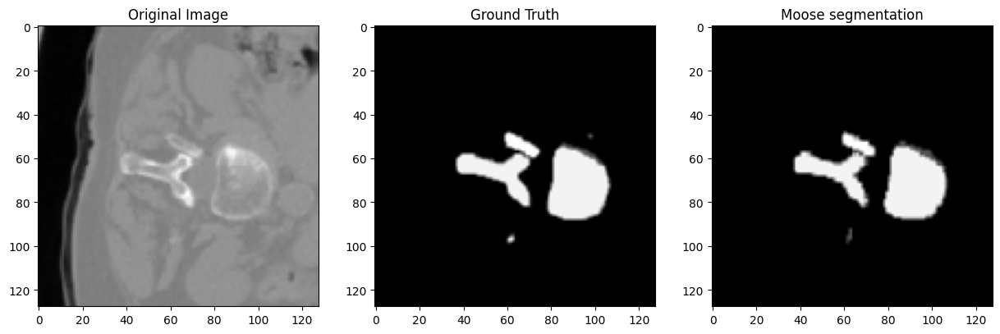

Dice Score for Pair 48: 0.5968695878982544
Image name: results_on_yes/sub-verse411_split-verse270/moosez-clin_ct_vertebrae-2024-07-14-21-40-50/segmentations/CT_Vertebrae_CT_sub-verse411_split-verse270_ct_0000.nii.gz


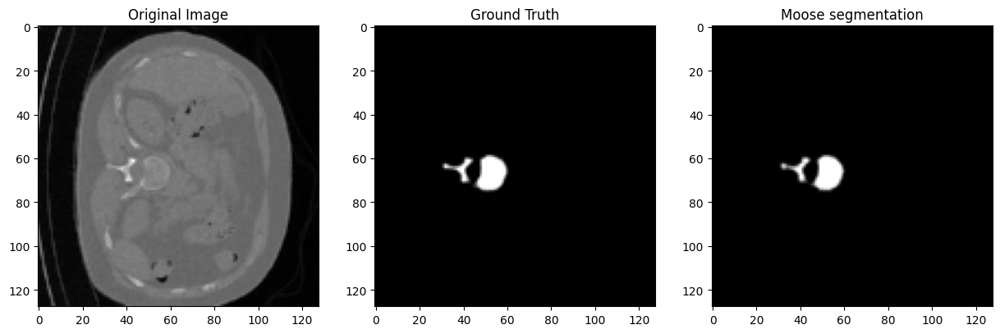

Dice Score for Pair 49: 0.7137681245803833
Image name: results_on_yes/sub-verse070/moosez-clin_ct_vertebrae-2024-07-14-19-26-35/segmentations/CT_Vertebrae_CT_sub-verse070_ct_0000.nii.gz


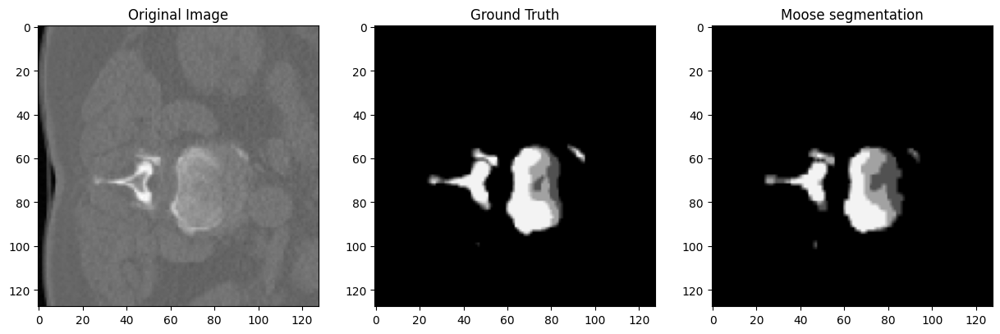

Dice Score for Pair 50: 0.5667390823364258
Image name: results_on_yes/sub-verse127/moosez-clin_ct_vertebrae-2024-07-14-20-03-28/segmentations/CT_Vertebrae_CT_sub-verse127_ct_0000.nii.gz


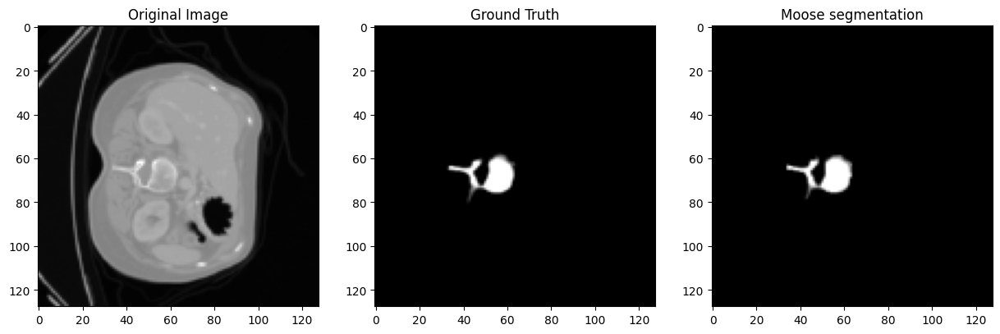

Dice Score for Pair 51: 0.41020289063453674
Image name: results_on_yes/sub-verse146/moosez-clin_ct_vertebrae-2024-07-14-22-06-44/segmentations/CT_Vertebrae_CT_sub-verse146_ct_0000.nii.gz


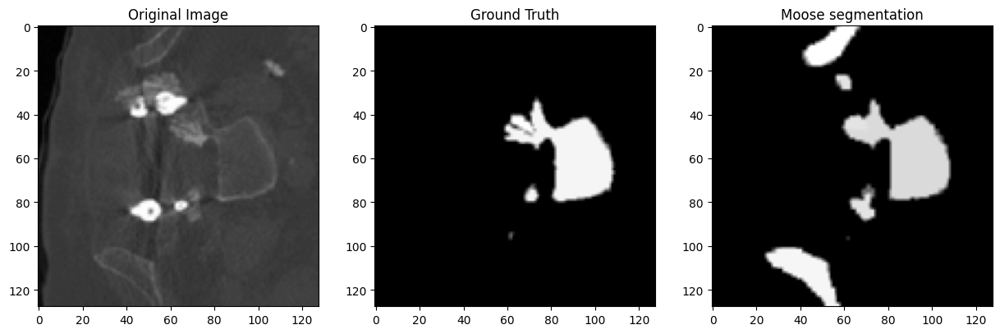

Dice Score for Pair 52: 0.6025640964508057
Image name: results_on_yes/sub-verse151/moosez-clin_ct_vertebrae-2024-07-14-19-28-11/segmentations/CT_Vertebrae_CT_sub-verse151_ct_0000.nii.gz


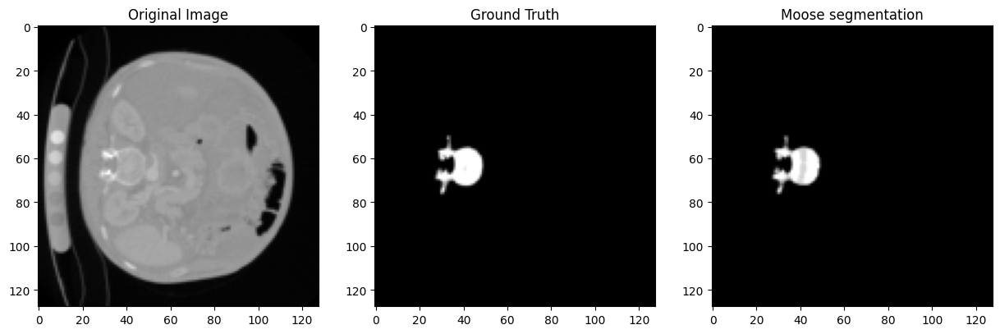

Dice Score for Pair 53: 0.8507869243621826
Image name: results_on_yes/sub-verse150/moosez-clin_ct_vertebrae-2024-07-14-22-10-29/segmentations/CT_Vertebrae_CT_sub-verse150_ct_0000.nii.gz


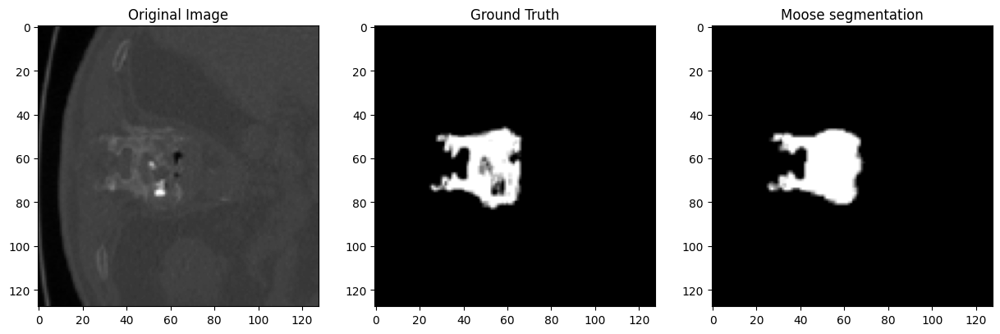

Dice Score for Pair 54: 0.7291111946105957
Image name: results_on_yes/sub-verse122/moosez-clin_ct_vertebrae-2024-07-15-01-15-32/segmentations/CT_Vertebrae_CT_sub-verse122_ct_0000.nii.gz


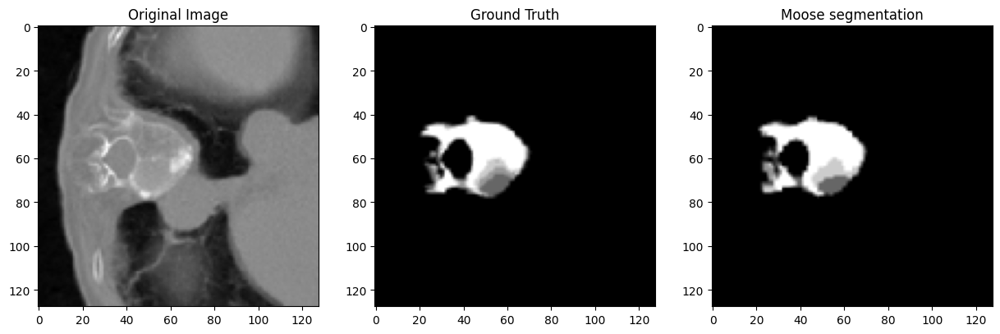

Dice Score for Pair 55: 0.4983513653278351
Image name: results_on_yes/sub-verse022/moosez-clin_ct_vertebrae-2024-07-14-20-52-28/segmentations/CT_Vertebrae_CT_sub-verse022_ct_0000.nii.gz


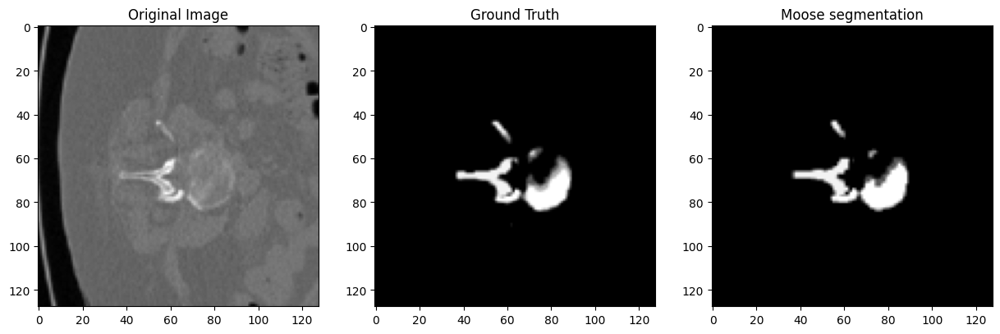

Dice Score for Pair 56: 0.8273094296455383
Image name: results_on_yes/sub-verse075/moosez-clin_ct_vertebrae-2024-07-14-23-03-16/segmentations/CT_Vertebrae_CT_sub-verse075_ct_0000.nii.gz


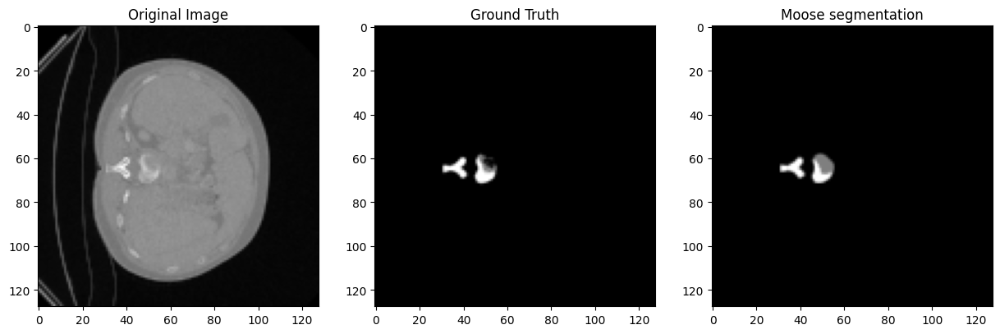

Dice Score for Pair 57: 0.8803418874740601
Image name: results_on_yes/sub-verse412_split-verse235/moosez-clin_ct_vertebrae-2024-07-14-23-22-52/segmentations/CT_Vertebrae_CT_sub-verse412_split-verse235_ct_0000.nii.gz


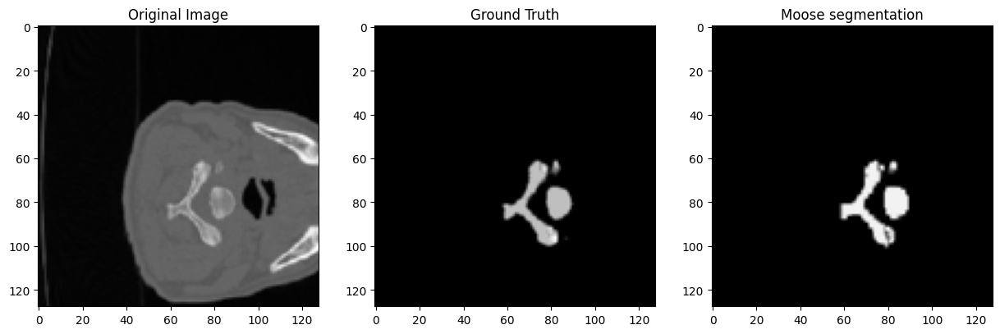

Dice Score for Pair 58: 0.8315529227256775
Image name: results_on_yes/sub-verse408_split-verse223/moosez-clin_ct_vertebrae-2024-07-14-19-56-17/segmentations/CT_Vertebrae_CT_sub-verse408_split-verse223_ct_0000.nii.gz


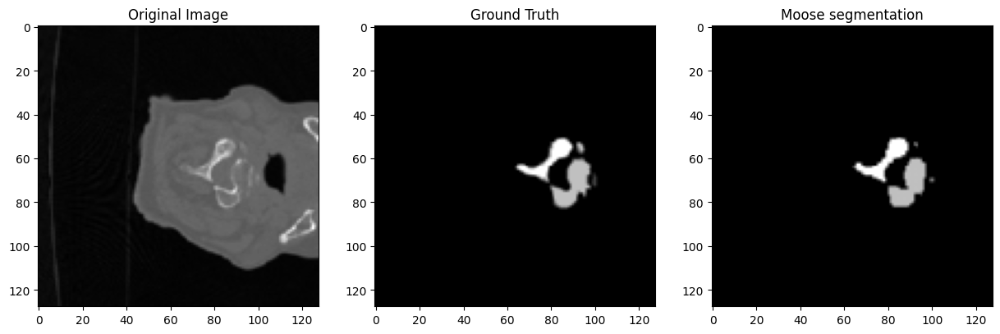

Dice Score for Pair 59: 0.8786534070968628
Image name: results_on_yes/sub-verse221/moosez-clin_ct_vertebrae-2024-07-15-01-29-18/segmentations/CT_Vertebrae_CT_sub-verse221_ct_0000.nii.gz


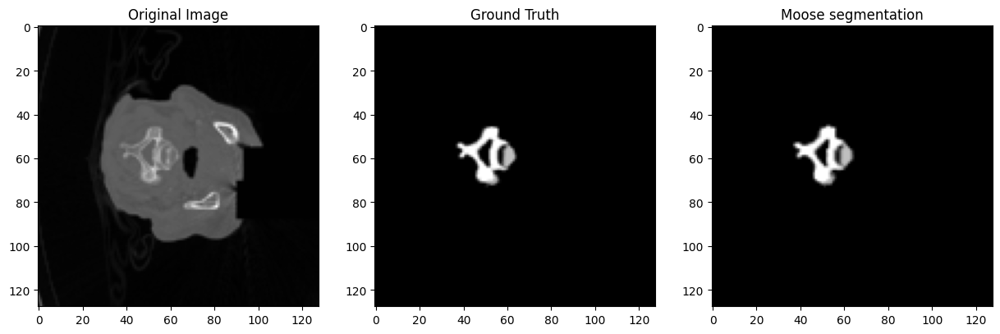

Dice Score for Pair 60: 0.6417720913887024
Image name: results_on_yes/sub-verse104/moosez-clin_ct_vertebrae-2024-07-14-19-45-40/segmentations/CT_Vertebrae_CT_sub-verse104_ct_0000.nii.gz


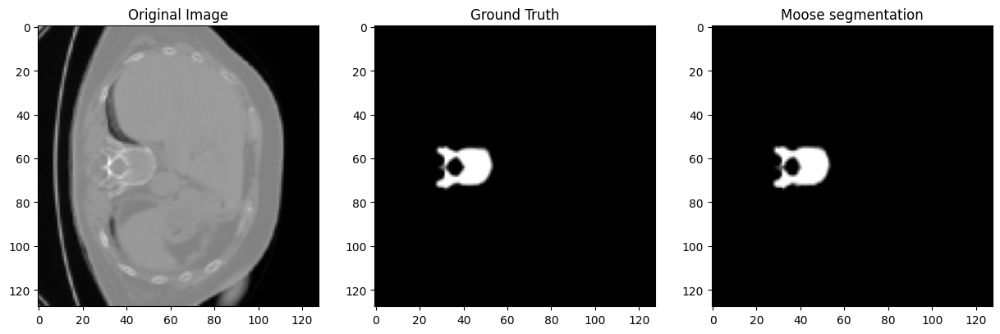

Dice Score for Pair 61: 0.611629068851471
Image name: results_on_yes/sub-verse409_split-verse266/moosez-clin_ct_vertebrae-2024-07-14-19-57-51/segmentations/CT_Vertebrae_CT_sub-verse409_split-verse266_ct_0000.nii.gz


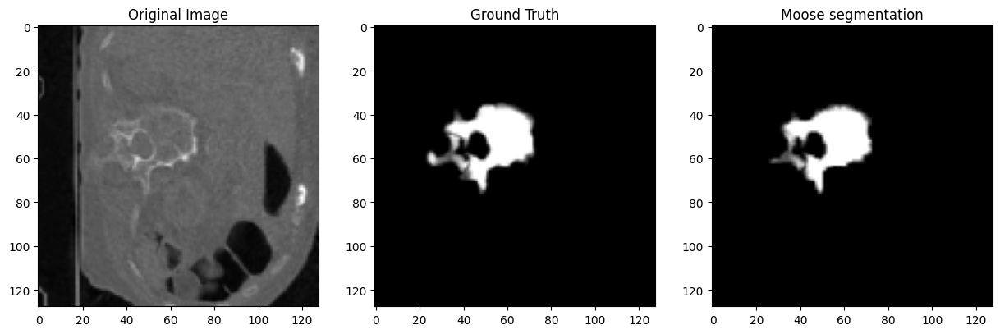

In [6]:
# Define MONAI transforms
transforms = Compose([
    LoadImage(image_only=True),
    EnsureChannelFirst(),
    ScaleIntensity(),
    Resize(spatial_size=common_size),  # Resize all images to the common size
    ToTensor()
])

# Create datasets
segmentation_dataset = Dataset(data=segmentation_files, transform=transforms)
ground_truth_dataset = Dataset(data=ground_truth_files, transform=transforms)
original_dataset = Dataset(data=original_files, transform=transforms)

# Create data loaders
segmentation_loader = DataLoader(segmentation_dataset, batch_size=1, num_workers=2)
ground_truth_loader = DataLoader(ground_truth_dataset, batch_size=1, num_workers=2)
original_loader = DataLoader(original_dataset, batch_size=1, num_workers=2)

# Initialize Dice metric
dice_metric = DiceMetric(include_background=False, reduction="mean")

dice_values = []

# Compute Dice metric for each pair of images and visualize them
for i, (seg_images, gt_images, orig_images) in enumerate(zip(segmentation_loader, ground_truth_loader, original_loader)):
    # Apply threshold to convert probabilistic images to binary
    seg_images_binary = (seg_images > 0).float()
    gt_images_binary = (gt_images > 0).float()

    # Calculate Dice score
    dice_metric(seg_images_binary, gt_images_binary)

    dice_values.append(dice_metric.aggregate().item())
    print(f"Dice Score for Pair {i}: {dice_metric.aggregate().item()}")
    print(f"Image name: {segmentation_files[i]}")

    dice_metric.reset()

    # Convert tensors to numpy arrays for visualization
    # seg_image_np = seg_images_binary.numpy()[0, 0, :, :, :]  # Assuming 3D volume
    # gt_image_np = gt_images_binary.numpy()[0, 0, :, :, :]
    # orig_image_np = orig_images.numpy()[0, 0, :, :, :]
    seg_image_np = seg_images.numpy()[0, 0, :, :, :]  # Assuming 3D volume
    gt_image_np = gt_images.numpy()[0, 0, :, :, :]
    orig_image_np = orig_images.numpy()[0, 0, :, :, :]

    # Plot the middle slice of each volume
    middle_slice = common_size[2] // 2

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(orig_image_np[:, :, middle_slice], cmap='gray')
    # plt.imshow(orig_image_np[middle_slice, :, :], cmap='gray')
    plt.subplot(1, 3, 2)
    plt.title("Ground Truth")
    plt.imshow(gt_image_np[:, :, middle_slice], cmap='gray')
    # plt.imshow(gt_image_np[middle_slice, :, :], cmap='gray')
    plt.subplot(1, 3, 3)
    plt.title("Moose segmentation")
    plt.imshow(seg_image_np[:, :, middle_slice], cmap='gray')
    # plt.imshow(seg_image_np[middle_slice, :, :], cmap='gray')
    plt.show()


In [7]:
np.mean(dice_values)

0.650497755937038

In [8]:
np.std(dice_values)

0.1582791900214969

In [9]:
np.max(dice_values)

0.8925895094871521